In [1]:
import pandas as pd
import numpy as np
import os 
import logging
from pathlib import Path
import matplotlib.pyplot as plt
plt.style.use(['science','nature','no-latex'])
logging.getLogger('matplotlib.font_manager').disabled = True
from load_data import *

from opt import get_LJs, get_DEs, fit_func, get_freeDEs, get_freeLJs, get_DEplus
from plot import plot_energy_MSE, eval_2d_LJ, eval_2d_DE, eval_2d_freeDE

from opt import FF

bounds_4 = [(0.0001, 3.9), (0.0001, 3.9), (0.00001, 2), (0.00001, 2)]
bounds_6 = [(0.0001, 3.9), (0.0001, 3.9), (0.00001, 2), (0.00001, 2), (1, 20), (1, 20)]
bounds_7 = [(0.0001, 3.9), (0.0001, 3.9), (0.00001, 2), (0.00001, 2), (1, 20), (1, 20), (1, 20)]
bounds_8 = [(0.0001, 3.9), (0.0001, 3.9), (0.00001, 2), (0.00001, 2), (1, 20), (1, 20), (1, 20),(-2000, 2000)]
%load_ext autoreload
%autoreload 2

def plot_2d(ff, lim=True):
    ff.set_dists({"OO": OO_dim, "OH": OH_dim, "HH": HH_dim})

    dimer_ccsdt = pd.read_csv("dimers_ccsdt.csv")
    len(dimer_ccsdt)
    dimer_ccsdt["ETOT"] = dimer_ccsdt["int_CCSDT"]
    dimer_ccsdt["ele"] = dimer_ccsdt["int_CCSDT"]
    dimer_ccsdt["ELST"] = dimer_ccsdt["int_CCSDT"]


    ff.data = dimer_ccsdt
    _ = ff.get_best_df()
    dist=[0.75, 1, 1.25, 1.5, 1.75, 2, 2.25, 2.5, 2.75, 3, 3.25, 3.5, 3.75, 4, 4.25, 4.5, 4.75, 5, 5.25, 5.5, 5.75, 6, 7, 8]

    plt.plot(dist, _["LJ"])
    if lim:
        plt.xlim(0.75,5)
        plt.ylim(-1,1)
    plt.axhline(0, c="k")
    
    
def get_energy(path):
    lines = open(path).readlines()
    try:
        ccsdt, mp2, hf = (float(x) for x in lines[-3].split())
        return ccsdt, mp2, hf
    except ValueError:
        return None

bach_base = Path("/home/boittier/pcbach")
cluster_path = bach_base / "molpro_energies"
singles_path = bach_base / "3body/f12"

#  Loading data

In [3]:
cluster_files = [_ for _ in cluster_path.iterdir() if _.is_dir()]
singles_files = [_ for _ in singles_path.iterdir() if _.is_dir()]

cluster_dict = {_.name : [x for x in _.iterdir() if x.name.endswith("out") and x.name.startswith("t")] for _ in cluster_files}
singles_dict = {_.name : [x for x in _.iterdir() if x.name.endswith("out") and x.name.startswith("t")] for _ in singles_files}

df = pd.DataFrame({"cluster_path": cluster_dict, "singles_paths": singles_dict})

failed = list(df[df["singles_paths"].str.len() == 0].index)
success = df[df["singles_paths"].str.len() != 0]

df["cluster_E"] = df["cluster_path"].apply(lambda x: get_energy(x[0]))
df["c_HF"] = df["cluster_E"] .apply(lambda x: x[2] if x is not None else None)
df["c_MP2"] = df["cluster_E"] .apply(lambda x: x[1] if x is not None else None)
df["c_CCSDT"] = df["cluster_E"] .apply(lambda x: x[0] if x is not None else None)

df["singles_E"] = df["singles_paths"].apply(lambda x: [get_energy(_) for _ in x])
df["s_HF"] = df["singles_E"].apply(lambda x: np.sum([_[2] for _ in x]) if x is not None else None)
df["s_MP2"] = df["singles_E"].apply(lambda x: np.sum([_[1] for _ in x]) if x is not None else None)
df["s_CCSDT"] = df["singles_E"].apply(lambda x: np.sum([_[0] for _ in x]) if x is not None else None)

H2kcalmol = 627.503
df["int_HF"] = (df["c_HF"]  - df["s_HF"]) * H2kcalmol
df["int_MP2"] = (df["c_MP2"]  - df["s_MP2"]) * H2kcalmol
df["int_CCSDT"] = (df["c_CCSDT"]  - df["s_CCSDT"]) * H2kcalmol

clean_df = df.dropna()

In [5]:

# " ".join(failed)

In [9]:
# df

In [11]:
# plt.hist(clean_df["c_HF"]*H2kcalmol - (clean_df["c_HF"]*H2kcalmol).mean(), alpha=0.51, fc="None", edgecolor="g")
# plt.hist(clean_df["c_MP2"]*H2kcalmol - (clean_df["c_MP2"]*H2kcalmol).mean(), alpha=0.51, fc="None", edgecolor="b")
# plt.hist(clean_df["c_CCSDT"]*H2kcalmol - (clean_df["c_CCSDT"]*H2kcalmol).mean(), alpha=0.51, fc="None", edgecolor="r")

In [12]:
len(clean_df)

186

#  Comparing LoT

In [13]:
compare_df = pd.DataFrame({"HF": clean_df["int_HF"] ,
                          "MP2": clean_df["int_MP2"],
                          "CCSD(T)": clean_df["int_CCSDT"]})

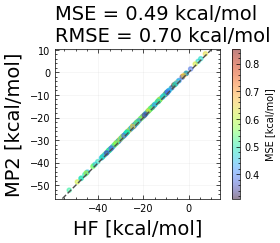

In [14]:
plot_energy_MSE(compare_df, "HF", "MP2", 
                elec="MSE", 
                xlabel="HF [kcal/mol]", 
                ylabel="MP2 [kcal/mol]", 
                cbar_label="MSE [kcal/mol]", 
                CMAP="turbo")

plt.savefig("mp2_hf_intE.pdf", bbox_inches="tight")

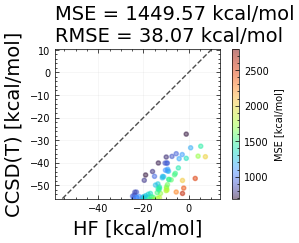

In [15]:
plot_energy_MSE(compare_df, "HF", "CCSD(T)", 
                elec="MSE", 
                xlabel="HF [kcal/mol]", 
                ylabel="CCSD(T) [kcal/mol]", 
                cbar_label="MSE [kcal/mol]", 
                CMAP="turbo")
plt.savefig("ccsdt_hf_intE.pdf", bbox_inches="tight")

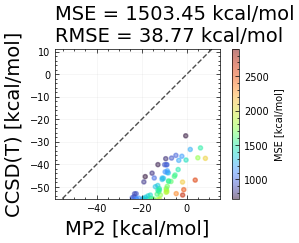

In [16]:
plot_energy_MSE(compare_df, "MP2", "CCSD(T)", 
                elec="MSE", 
                xlabel="MP2 [kcal/mol]", 
                ylabel="CCSD(T) [kcal/mol]", 
                cbar_label="MSE [kcal/mol]", 
                CMAP="turbo")
plt.savefig("mp2_ccsdt_intE.pdf", bbox_inches="tight")

In [17]:
compare_df = pd.DataFrame({"HF": clean_df["c_HF"]*H2kcalmol - (clean_df["c_HF"]*H2kcalmol).mean(),
                          "MP2": clean_df["c_MP2"]*H2kcalmol - (clean_df["c_MP2"]*H2kcalmol).mean(),
                          "CCSD(T)": clean_df["c_CCSDT"]*H2kcalmol - (clean_df["c_CCSDT"]*H2kcalmol).mean()})

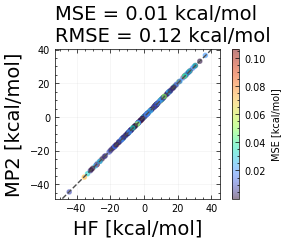

In [18]:
plot_energy_MSE(compare_df, "HF", "MP2", 
                elec="MSE", 
                xlabel="HF [kcal/mol]", 
                ylabel="MP2 [kcal/mol]", 
                cbar_label="MSE [kcal/mol]", 
                CMAP="turbo")
plt.savefig("mp2_hf_cE.pdf", bbox_inches="tight")

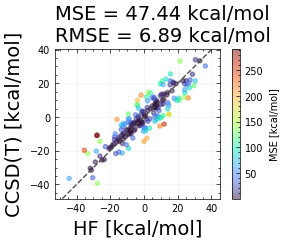

In [19]:
plot_energy_MSE(compare_df, "HF", "CCSD(T)", 
                elec="MSE", 
                xlabel="HF [kcal/mol]", 
                ylabel="CCSD(T) [kcal/mol]", 
                cbar_label="MSE [kcal/mol]", 
                CMAP="turbo")
plt.savefig("ccsdt_hf_cE.pdf", bbox_inches="tight")

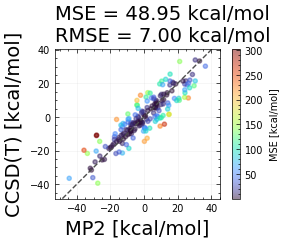

In [20]:
plot_energy_MSE(compare_df, "MP2", "CCSD(T)", 
                elec="MSE", 
                xlabel="MP2 [kcal/mol]", 
                ylabel="CCSD(T) [kcal/mol]", 
                cbar_label="MSE [kcal/mol]", 
                CMAP="turbo")
plt.savefig("mp2_ccsdt_cE.pdf", bbox_inches="tight")

In [21]:
elec="ele"

def prepare_FF_DE(df, elec="ele", data="int_CCSDT"):
    cluster = df.copy()
    cluster.index = cluster["key"]

    flux_clean = pd.merge(cluster, clean_df, left_index=True, right_index = True)

    test_dict = {a: b for a,b in zip(cluster["key"], OO)}
    OO_df = pd.DataFrame(test_dict).T
    OO_df = pd.merge(OO_df, clean_df, left_index=True, right_index = True)
    OO_np = OO_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], OH)}
    OH_df = pd.DataFrame(test_dict).T
    OH_df = pd.merge(OH_df, clean_df, left_index=True, right_index = True)
    OH_np = OH_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], HH)}
    HH_df = pd.DataFrame(test_dict).T
    HH_df = pd.merge(HH_df, clean_df, left_index=True, right_index = True)
    HH_np = HH_df[[i for i in range(190)]].to_numpy()

    df = flux_clean
    # df["ETOT"] = df["int_HF"]
    df["ETOT"] = df[data]

    ff = FF(df, {"OO": OO_np, "OH": OH_np, "HH": HH_np}, get_DEs, elec=elec)
    return ff

def prepare_FF_freeDE(df, elec="ele",data="int_CCSDT"):
    cluster = df.copy()
    cluster.index = cluster["key"]

    flux_clean = pd.merge(cluster, clean_df, left_index=True, right_index = True)

    test_dict = {a: b for a,b in zip(cluster["key"], OO)}
    OO_df = pd.DataFrame(test_dict).T
    OO_df = pd.merge(OO_df, clean_df, left_index=True, right_index = True)
    OO_np = OO_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], OH)}
    OH_df = pd.DataFrame(test_dict).T
    OH_df = pd.merge(OH_df, clean_df, left_index=True, right_index = True)
    OH_np = OH_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], HH)}
    HH_df = pd.DataFrame(test_dict).T
    HH_df = pd.merge(HH_df, clean_df, left_index=True, right_index = True)
    HH_np = HH_df[[i for i in range(190)]].to_numpy()

    df = flux_clean
    # df["ETOT"] = df["int_HF"]
    df["ETOT"] = df[data]

    ff = FF(df, {"OO": OO_np, "OH": OH_np, "HH": HH_np}, get_freeDEs, elec=elec)
    return ff

def prepare_FF_LJ(df, elec="ele",data="int_CCSDT"):
    cluster = df.copy()
    cluster.index = cluster["key"]

    flux_clean = pd.merge(cluster, clean_df, left_index=True, right_index = True)

    test_dict = {a: b for a,b in zip(cluster["key"], OO)}
    OO_df = pd.DataFrame(test_dict).T
    OO_df = pd.merge(OO_df, clean_df, left_index=True, right_index = True)
    OO_np = OO_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], OH)}
    OH_df = pd.DataFrame(test_dict).T
    OH_df = pd.merge(OH_df, clean_df, left_index=True, right_index = True)
    OH_np = OH_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], HH)}
    HH_df = pd.DataFrame(test_dict).T
    HH_df = pd.merge(HH_df, clean_df, left_index=True, right_index = True)
    HH_np = HH_df[[i for i in range(190)]].to_numpy()

    df = flux_clean
    # df["ETOT"] = df["int_HF"]
    df["ETOT"] = df[data]

    ff = FF(df, {"OO": OO_np, "OH": OH_np, "HH": HH_np}, get_LJs, elec=elec)
    return ff

def prepare_FF_freeLJ(df, elec="ele", data="int_CCSDT"):
    cluster = df.copy()
    cluster.index = cluster["key"]

    flux_clean = pd.merge(cluster, clean_df, left_index=True, right_index = True)

    test_dict = {a: b for a,b in zip(cluster["key"], OO)}
    OO_df = pd.DataFrame(test_dict).T
    OO_df = pd.merge(OO_df, clean_df, left_index=True, right_index = True)
    OO_np = OO_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], OH)}
    OH_df = pd.DataFrame(test_dict).T
    OH_df = pd.merge(OH_df, clean_df, left_index=True, right_index = True)
    OH_np = OH_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], HH)}
    HH_df = pd.DataFrame(test_dict).T
    HH_df = pd.merge(HH_df, clean_df, left_index=True, right_index = True)
    HH_np = HH_df[[i for i in range(190)]].to_numpy()

    df = flux_clean
    # df["ETOT"] = df["int_HF"]
    df["ETOT"] = df[data]

    ff = FF(df, {"OO": OO_np, "OH": OH_np, "HH": HH_np}, get_freeLJs, elec=elec)
    return ff

def prepare_FF_DEplus(df, elec="ele", data="int_CCSDT"):
    cluster = df.copy()
    cluster.index = cluster["key"]

    flux_clean = pd.merge(cluster, clean_df, left_index=True, right_index = True)

    test_dict = {a: b for a,b in zip(cluster["key"], OO)}
    OO_df = pd.DataFrame(test_dict).T
    OO_df = pd.merge(OO_df, clean_df, left_index=True, right_index = True)
    OO_np = OO_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], OH)}
    OH_df = pd.DataFrame(test_dict).T
    OH_df = pd.merge(OH_df, clean_df, left_index=True, right_index = True)
    OH_np = OH_df[[i for i in range(190)]].to_numpy()

    test_dict = {a: b for a,b in zip(cluster["key"], HH)}
    HH_df = pd.DataFrame(test_dict).T
    HH_df = pd.merge(HH_df, clean_df, left_index=True, right_index = True)
    HH_np = HH_df[[i for i in range(190)]].to_numpy()

    df = flux_clean
    # df["ETOT"] = df["int_HF"]
    df["ETOT"] = df[data]

    ff = FF(df, {"OO": OO_np, "OH": OH_np, "HH": HH_np}, get_DEplus, elec=elec)
    return ff


In [ ]:
ff = prepare_FF_DEplus(cluster_mdcm)

method = "Nelder-Mead"
# bounds_8 = [(0.0001, 3.9), (0.0001, 3.9), (0.00001, 2), (0.00001, 2), (1, 20), (1, 20), (1, 20),(-20000, 20000)]
bounds_8 = [(0,4),(0,4),(0,2),(0,2),(-30000,30000),(-30000,30000),(-30000,30000),(-30000,30000)] 
ff.fit_repeat(1, bounds=bounds_8, method=method, quiet=False)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

Optimizing LJ parameters...
function: get_DEplus
bounds: [(0, 4), (0, 4), (0, 2), (0, 2), (-30000, 30000), (-30000, 30000), (-30000, 30000), (-30000, 30000)]
maxfev: 10000
initial guess: [0.6311676494353238, 3.8306131152066905, 1.9199560124089117, 1.599301079114325, 3563.4282948471155, -7523.834430149029, -628.3720089972921, 16644.246243394962]


/home/boittier/Documents/phd/LJFit/opt.py:48: RuntimeWarning: overflow encountered in exp
  return e * (((b * np.exp(a)) / (a - b)) * np.exp(-a * (x / c))
/home/boittier/Documents/phd/LJFit/opt.py:48: RuntimeWarning: invalid value encountered in multiply
  return e * (((b * np.exp(a)) / (a - b)) * np.exp(-a * (x / c))
/home/boittier/Documents/phd/LJFit/opt.py:49: RuntimeWarning: overflow encountered in exp
  - ((a * np.exp(b)) / (a - b)) * np.exp(-b * (x / c))) - f * (c/x)**g
/home/boittier/Documents/phd/LJFit/opt.py:49: RuntimeWarning: invalid value encountered in multiply
  - ((a * np.exp(b)) / (a - b)) * np.exp(-b * (x / c))) - f * (c/x)**g
/home/boittier/Documents/phd/LJFit/opt.py:49: RuntimeWarning: overflow encountered in power
  - ((a * np.exp(b)) / (a - b)) * np.exp(-b * (x / c))) - f * (c/x)**g
/home/boittier/Documents/phd/LJFit/opt.py:49: RuntimeWarning: overflow encountered in multiply
  - ((a * np.exp(b)) / (a - b)) * np.exp(-b * (x / c))) - f * (c/x)**g
/home/boittier/Docu

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters


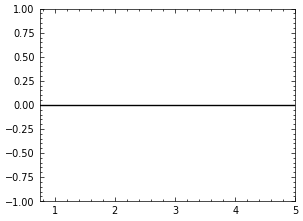

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters


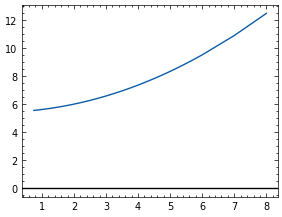

In [107]:
plot_2d(ff)
plt.show()
plot_2d(ff, lim=False)

In [ ]:
ff = prepare_FF_DEplus(cluster_mdcm, elec="ELST")

big = (-2000000000, 20000000000)
lj_feas = (0.01, 10)

method = "Nelder-Mead"
bounds_8 = [lj_feas, lj_feas, 
            lj_feas, lj_feas, 
            big, big, 
           big, lj_feas ]

ff.fit_repeat(1, bounds=bounds_8, method=method, quiet=False)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", "ELST", 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

Optimizing LJ parameters...
function: get_DEplus
bounds: [(0.01, 10), (0.01, 10), (0.01, 10), (0.01, 10), (-2000000000, 20000000000), (-2000000000, 20000000000), (-2000000000, 20000000000), (0.01, 10)]
maxfev: 10000
initial guess: [7.982613811282203, 6.03510548379442, 2.133355554564913, 4.958050122191957, 13466112352.612083, 6268597249.700554, 19969814378.015285, 7.173782115311973]


/home/boittier/Documents/phd/LJFit/opt.py:48: RuntimeWarning: overflow encountered in exp
  return e * (((b * np.exp(a)) / (a - b)) * np.exp(-a * (x / c))
/home/boittier/Documents/phd/LJFit/opt.py:48: RuntimeWarning: invalid value encountered in multiply
  return e * (((b * np.exp(a)) / (a - b)) * np.exp(-a * (x / c))
/home/boittier/Documents/phd/LJFit/opt.py:49: RuntimeWarning: overflow encountered in exp
  - ((a * np.exp(b)) / (a - b)) * np.exp(-b * (x / c))) - f * (c/x)**g
/home/boittier/Documents/phd/LJFit/opt.py:49: RuntimeWarning: invalid value encountered in multiply
  - ((a * np.exp(b)) / (a - b)) * np.exp(-b * (x / c))) - f * (c/x)**g
/home/boittier/Documents/phd/LJFit/opt.py:48: RuntimeWarning: overflow encountered in exp
  return e * (((b * np.exp(a)) / (a - b)) * np.exp(-a * (x / c))
/home/boittier/Documents/phd/LJFit/opt.py:48: RuntimeWarning: invalid value encountered in multiply
  return e * (((b * np.exp(a)) / (a - b)) * np.exp(-a * (x / c))
/home/boittier/Documents/phd

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters


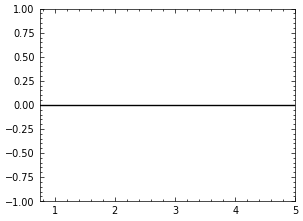

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters


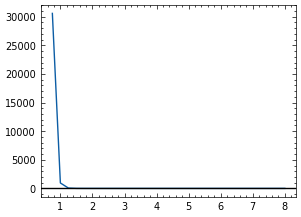

In [267]:
plot_2d(ff)
plt.show()
plot_2d(ff, lim=False)

# DE

##  MDCM - DE

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.78245361e+00 1.00000013e-04 2.38937582e-01 1.73771675e-01]


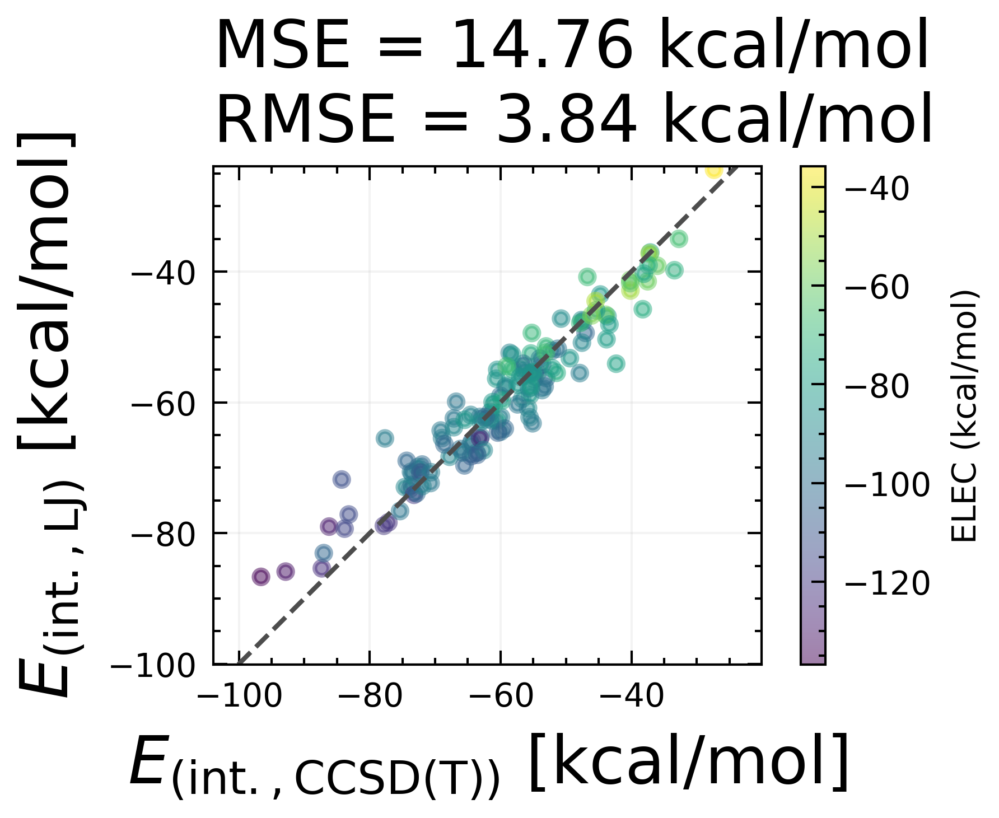

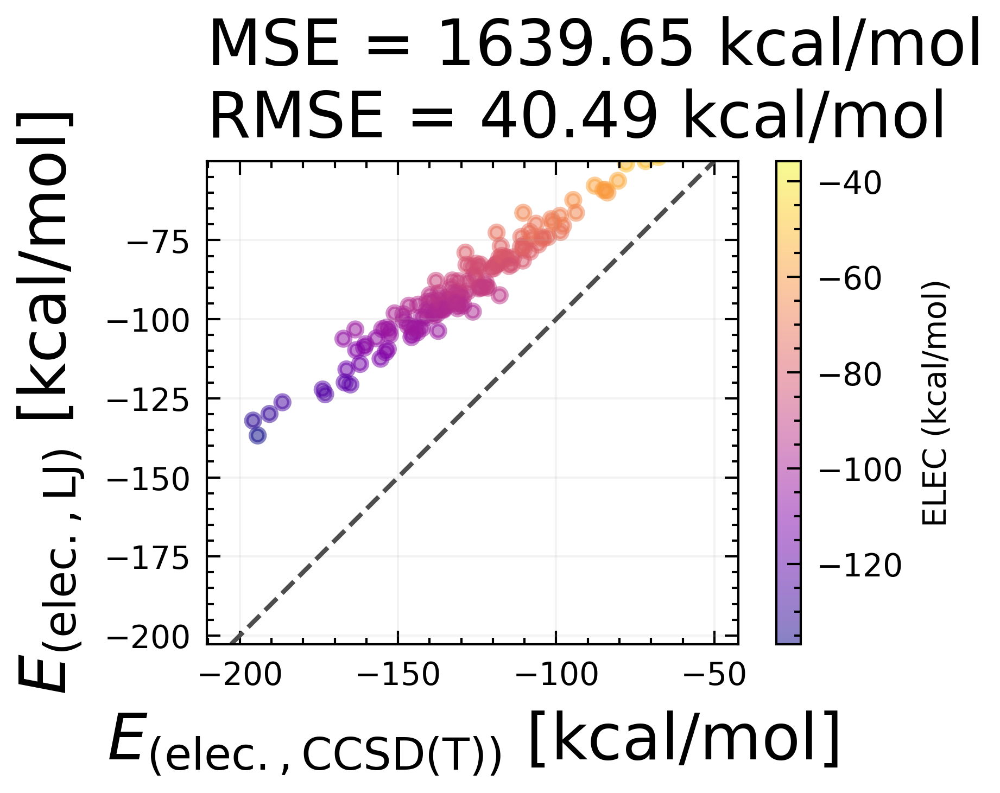

In [383]:
ff = prepare_FF_DE(cluster_mdcm)

method = "Nelder-Mead"
ff.fit_repeat(10, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

Text(0.5, 0, 'r $[\\mathrm{\\AA}]$')

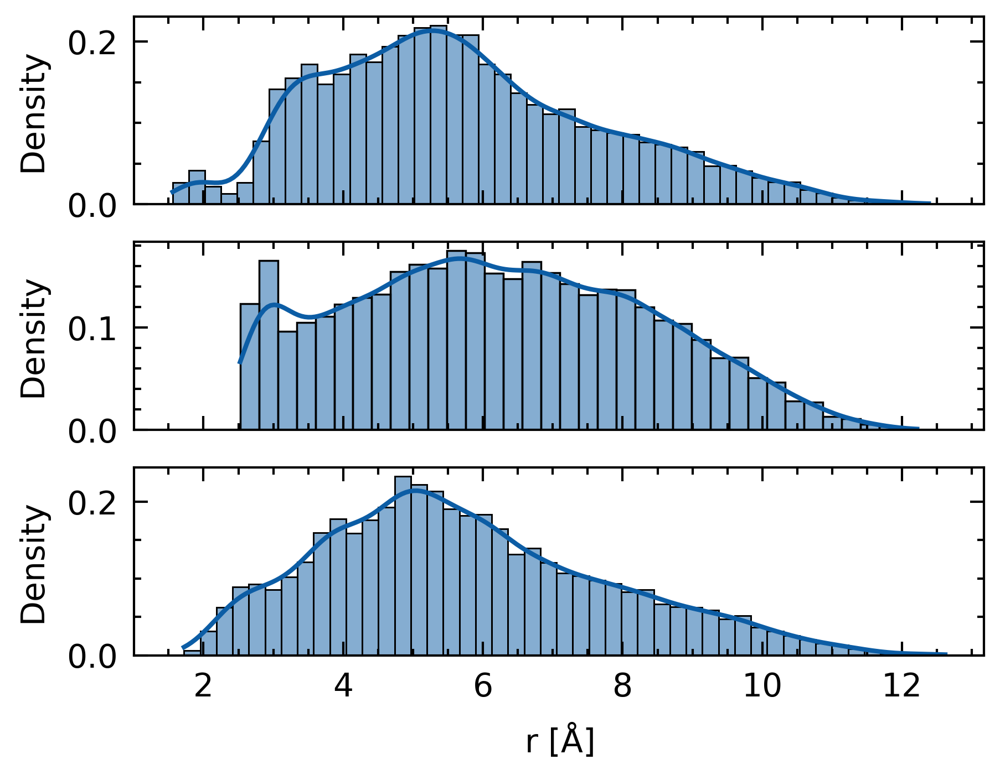

In [356]:
ff = prepare_FF_DE(cluster_mdcm)
# ! pip install seaborn
import seaborn as sns

fig, ax = plt.subplots(3, sharex=True)

dp = sns.histplot(ff.OH.flatten(), kde=True,
    stat="density", kde_kws=dict(cut=0), ax=ax[0])
dp = sns.histplot(ff.OO.flatten(), kde=True,
    stat="density", kde_kws=dict(cut=0), ax=ax[1])
dp = sns.histplot(ff.HH.flatten(), kde=True,
    stat="density", kde_kws=dict(cut=0), ax=ax[2])
plt.xlabel("r $[\mathrm{\AA}]$")

In [263]:

def get_dists(ff):
    mask = ff["Unnamed: 0"]
    print(len(mask))
    _OO = OO[mask]
    _OH = OH[mask]
    _HH = HH[mask]
    return _OO, _OH, _HH


# len(oo)

18
18


-1527.5075194675 -1527.474518235 0.033001232500055266
18
18


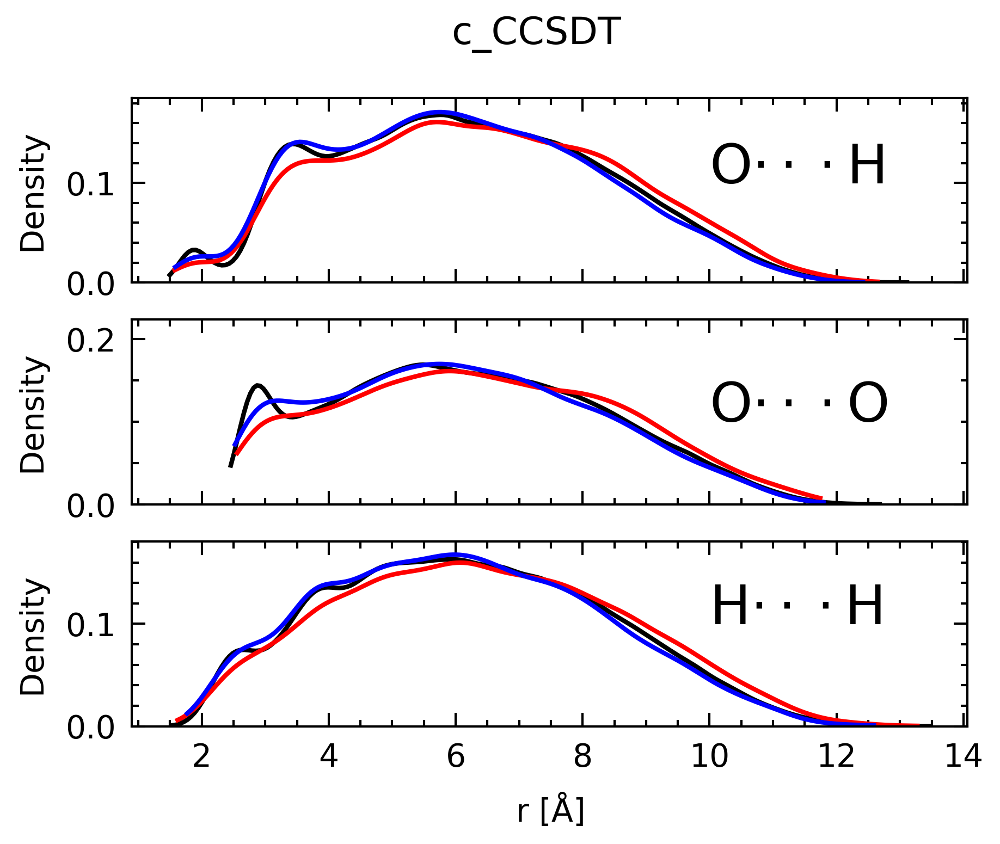

In [349]:
# sns.color_palette("viridis", as_cmap=True)
# sns.color_palette("pastel")

def plot_dists(ff, key='c_CCSDT', df=None, q1=0.25, q3=0.75):
    if df is not None:
        ff.df = df
    Q1 = ff.df[key].quantile(q1)
    Q3 = ff.df[key].quantile(q3)
    IQR = Q3 - Q1
    
    print(Q1, Q3, IQR)

    # Filtering Values between Q1-1.5IQR and Q3+1.5IQR
    filtered = ff.df.query(f'(@Q1 - 1.5 * @IQR) <= {key} >= (@Q3 + 1.5 * @IQR)')

    q1 = ff.df[ff.df[key] < Q1]
    q4 = ff.df[ff.df[key] > Q3]

    oo_q4, oh_q4, hh_q4 = get_dists(q4)
    oo_q1, oh_q1, hh_q1 = get_dists(q1)


    fig, ax = plt.subplots(3, sharex=True)
    
    plt.suptitle(key)

    ALPHA=0.

    dp = sns.histplot(OH.flatten(), kde=True,
        stat="density", kde_kws=dict(cut=0), ax=ax[0], fill=False, 
                      alpha=ALPHA,label="Sample distribution", color="k")
    dp = sns.histplot(OO.flatten(), kde=True,
        stat="density", kde_kws=dict(cut=0), ax=ax[1], fill=False,
                     alpha=ALPHA, color="k")
    dp = sns.histplot(HH.flatten(), kde=True,
        stat="density", kde_kws=dict(cut=0), ax=ax[2], fill=False,
                      alpha=ALPHA, color="k")

    dp = sns.histplot(oh_q4.flatten(), kde=True,
        stat="density", kde_kws=dict(cut=0), ax=ax[0], fill=False, 
                      alpha=ALPHA,label="Q4",color="r")
    dp = sns.histplot(oo_q4.flatten(), kde=True,
        stat="density", kde_kws=dict(cut=0), ax=ax[1], fill=False,label="Q4",alpha=ALPHA,color="r")
    dp = sns.histplot(hh_q4.flatten(), kde=True,
        stat="density", kde_kws=dict(cut=0), ax=ax[2], fill=False,label="Q4",alpha=ALPHA,color="r")

    dp = sns.histplot(oh_q1.flatten(), kde=True,
        stat="density", kde_kws=dict(cut=0), ax=ax[0], fill=False, 
                      alpha=ALPHA,label="Q1",color="b")
    dp = sns.histplot(oo_q1.flatten(), kde=True,
        stat="density", kde_kws=dict(cut=0), ax=ax[1], fill=False,label="Q1",alpha=ALPHA,color="b")
    dp = sns.histplot(hh_q1.flatten(), kde=True,
        stat="density", kde_kws=dict(cut=0), ax=ax[2], fill=False,label="Q1",alpha=ALPHA,color="b")
    
    ax[0].text(10, 0.1, "O$\cdot\cdot\cdot$H", fontsize=12, )
    ax[1].text(10, 0.1, "O$\cdot\cdot\cdot$O", fontsize=12, )
    ax[2].text(10, 0.1, "H$\cdot\cdot\cdot$H", fontsize=12, )



    plt.xlabel("r $[\mathrm{\AA}]$")
# ax[0].legend(fontsize=3)
plot_dists(ff)

-65.71643608685456 -48.26671500607785 17.449721080776705
18
18


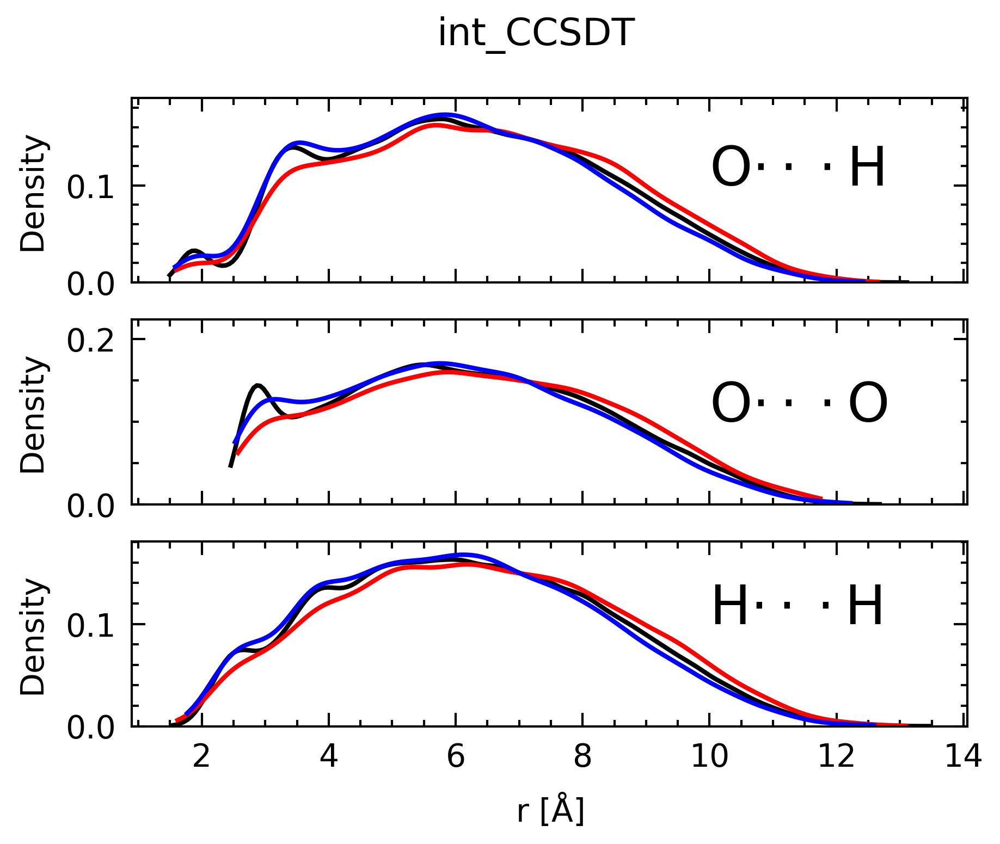

In [352]:
plot_dists(ff, key="int_CCSDT")

##  f-MDCM - DE

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.76552906e+00 1.00016143e-04 2.44956099e-01 1.24735604e-02]


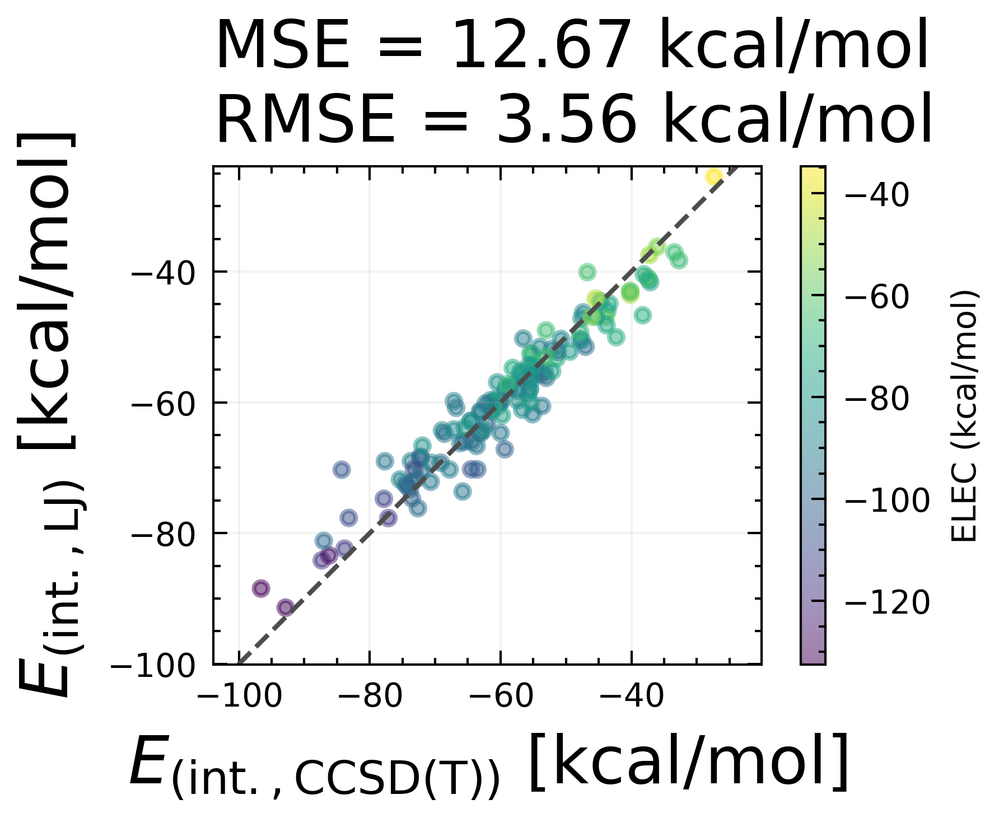

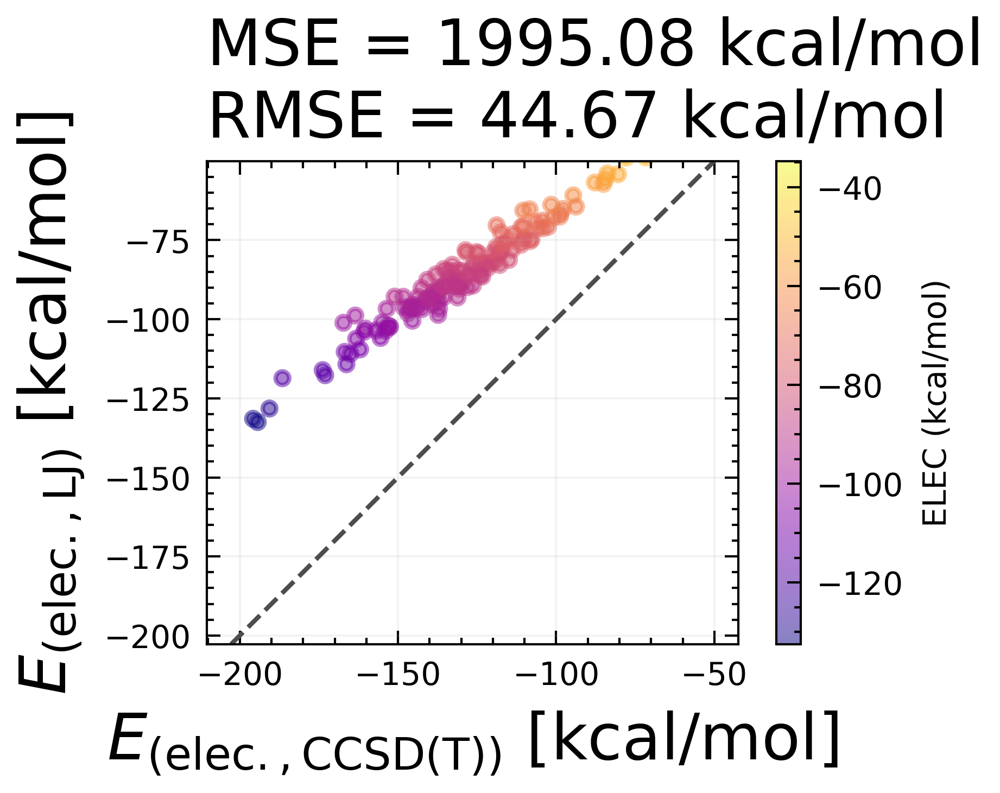

In [404]:
ff = prepare_FF_DE(cluster_flux)

method = "Nelder-Mead"
ff.fit_repeat(10, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

In [405]:
best = ff.get_best_df()

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters


Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
0.006434170538860242 73.0860362444851 73.07960207394623
1
1
3.2852142852672106 45.553308376394554 42.268094091127345
1
1


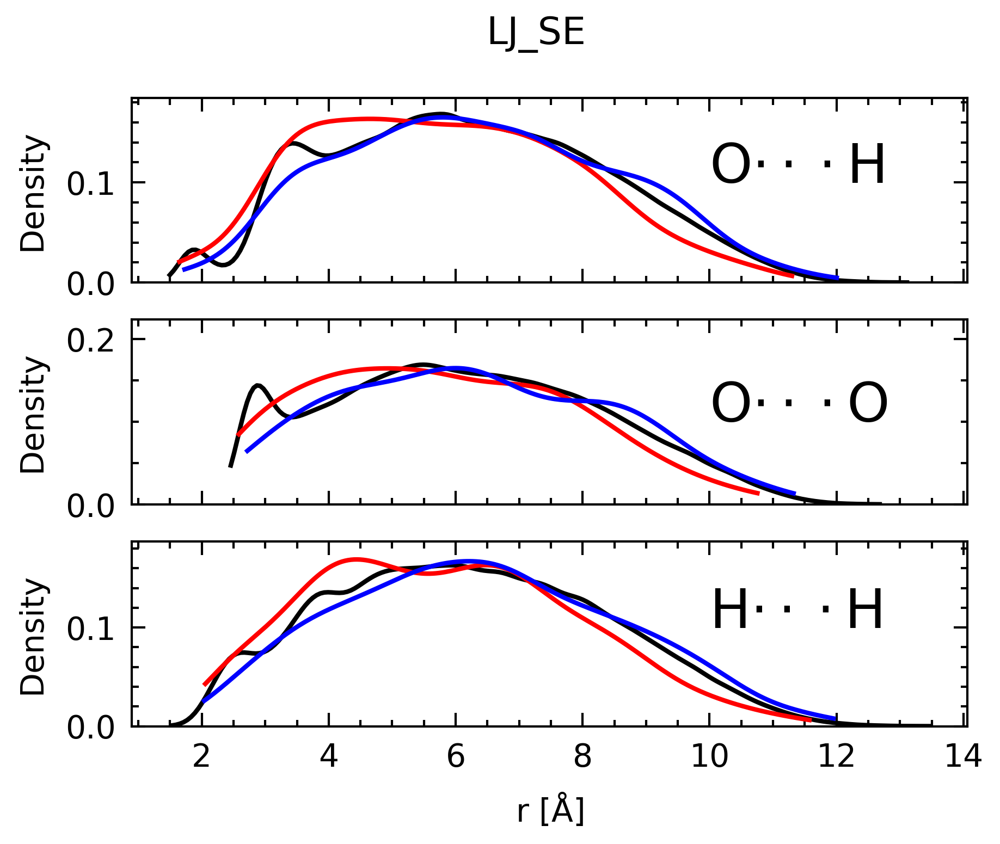

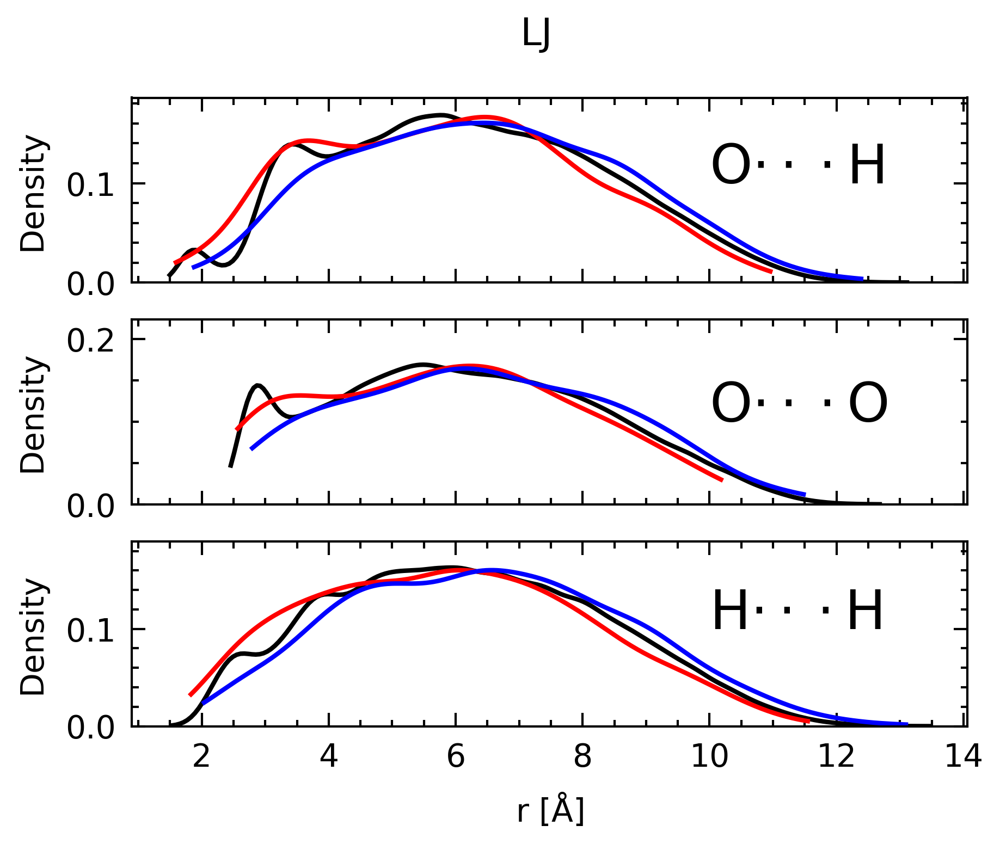

In [362]:
best = ff.get_best_df()
plot_dists(ff, key="LJ_SE", df=best, q1=0.005, q3=0.995)
plot_dists(ff, key="LJ", df=best, q1=0.005, q3=0.995)

##  Kern-MDCM - DE

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.76732652e+00 1.00000000e-04 2.39336866e-01 1.00000000e-05]


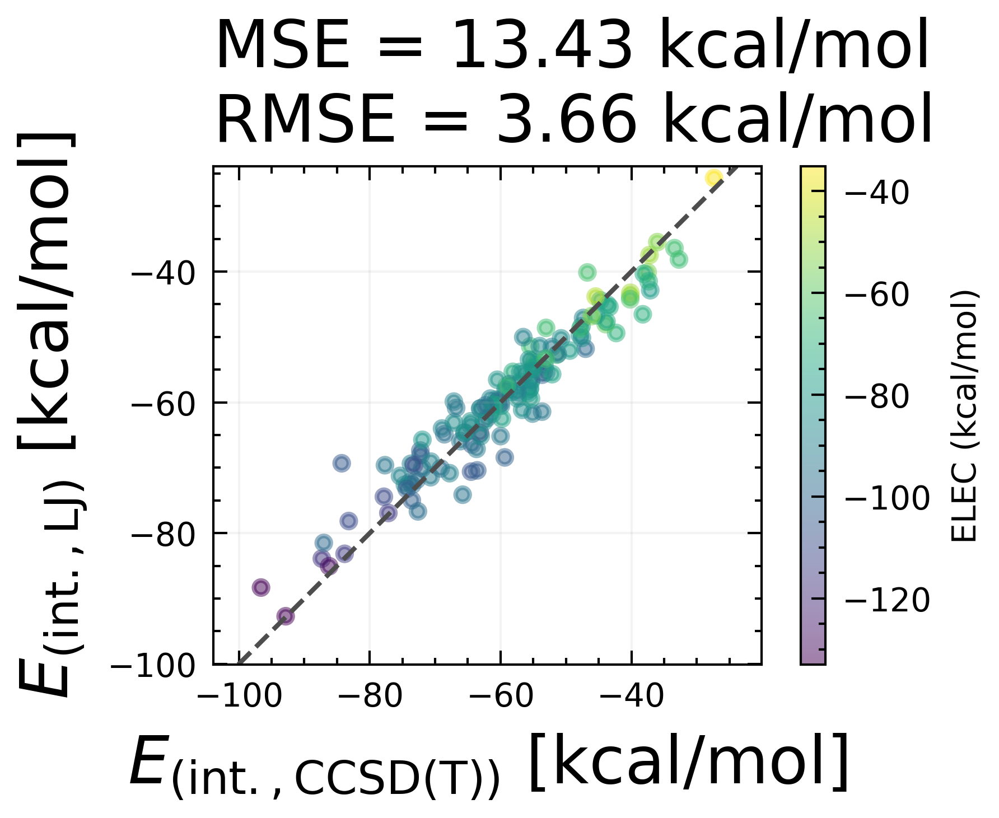

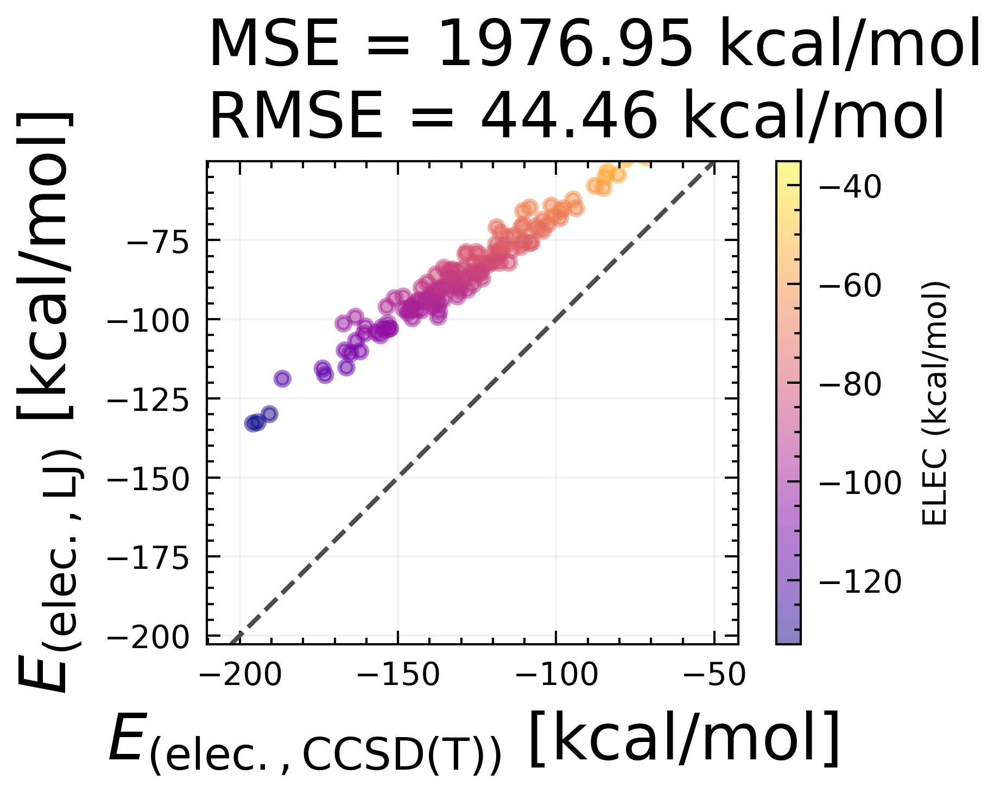

In [425]:
ff = prepare_FF_DE(cluster_kern)

method = "Nelder-Mead"
ff.fit_repeat(3, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters


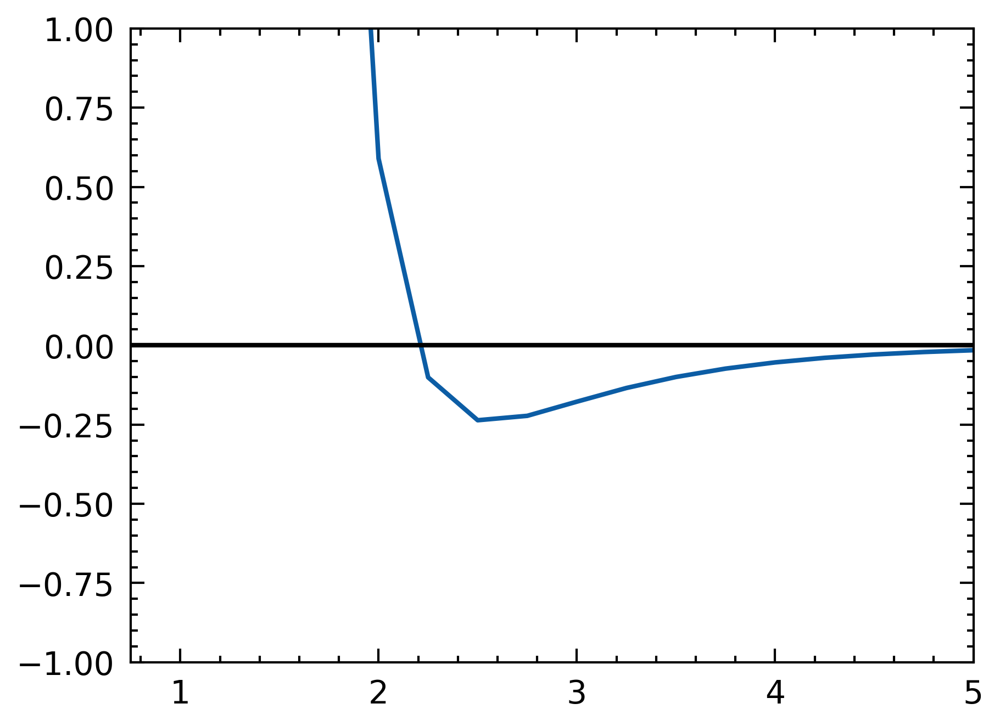

In [426]:
plot_2d(ff)

##  ELST - DE

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.91655098e+00 1.00000000e-04 1.59061981e-01 1.01202927e-01]


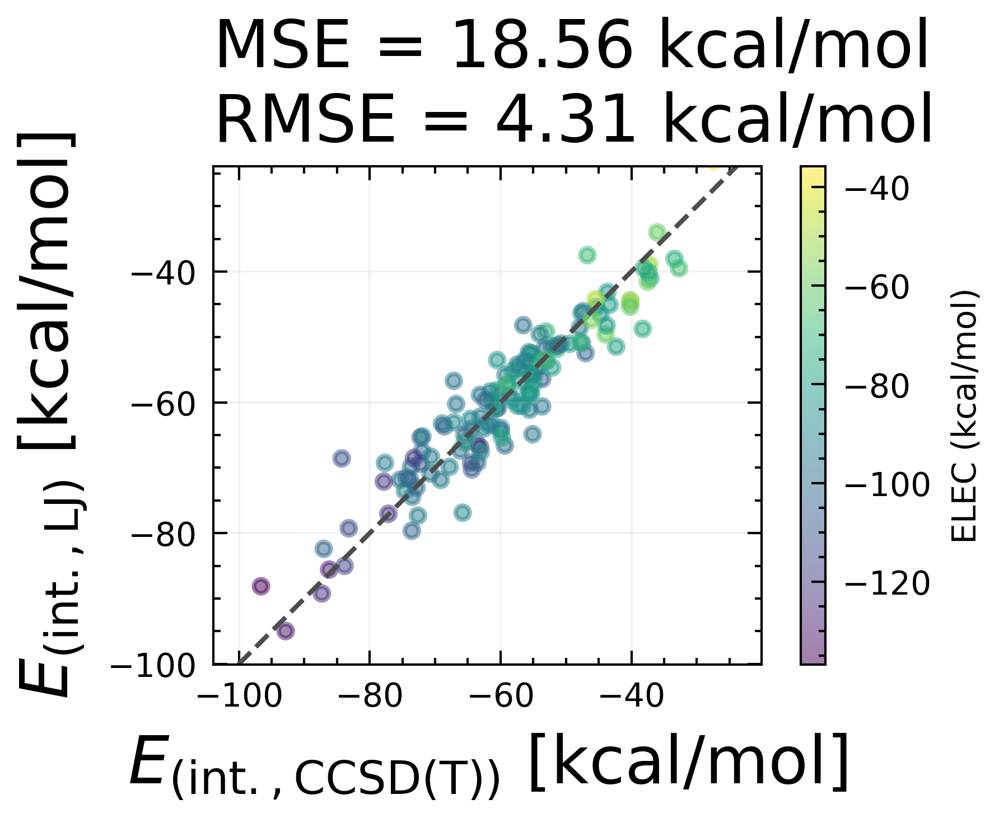

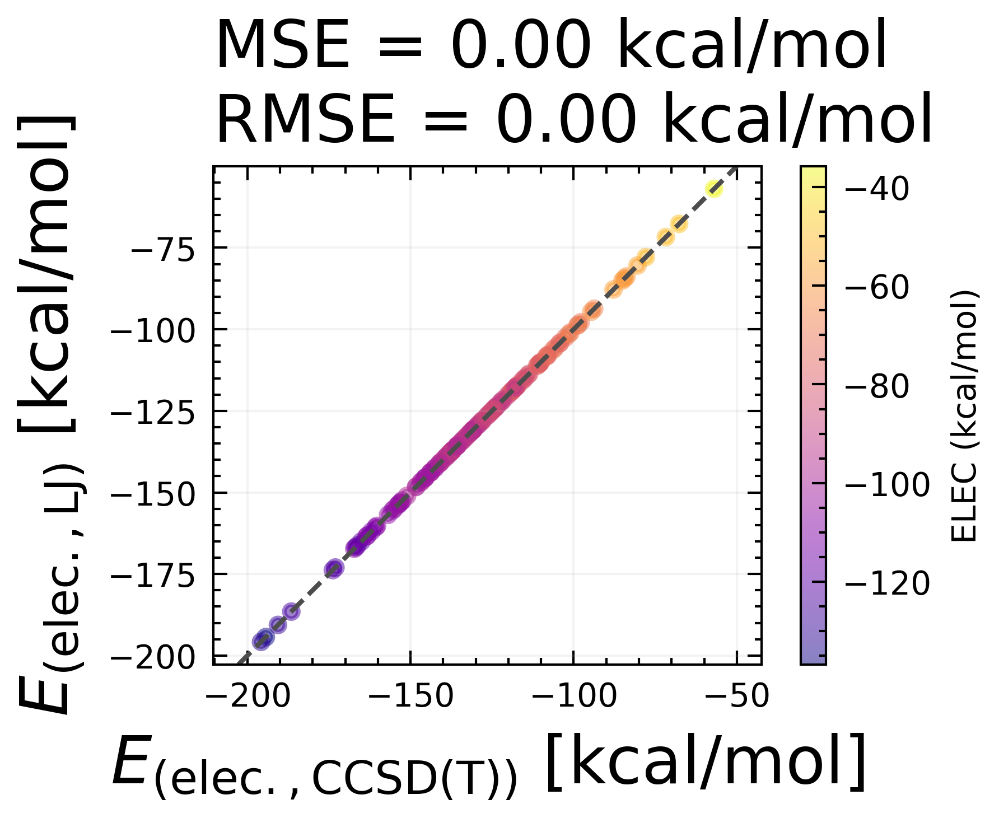

In [429]:
ff = prepare_FF_DE(cluster_mdcm, elec="ELST")

method = "Nelder-Mead"
ff.fit_repeat(5, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", "ELST", 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters


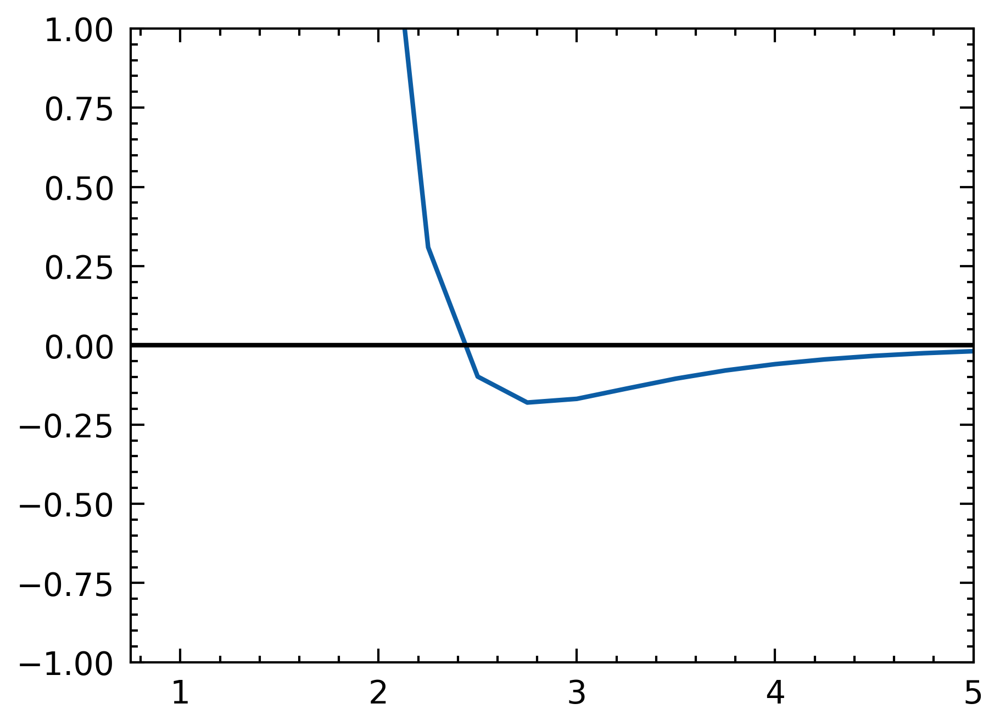

In [432]:
plot_2d(ff)

##  PC - DE

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.71693518e+00 1.00000000e-04 3.44457480e-01 2.00000000e+00]


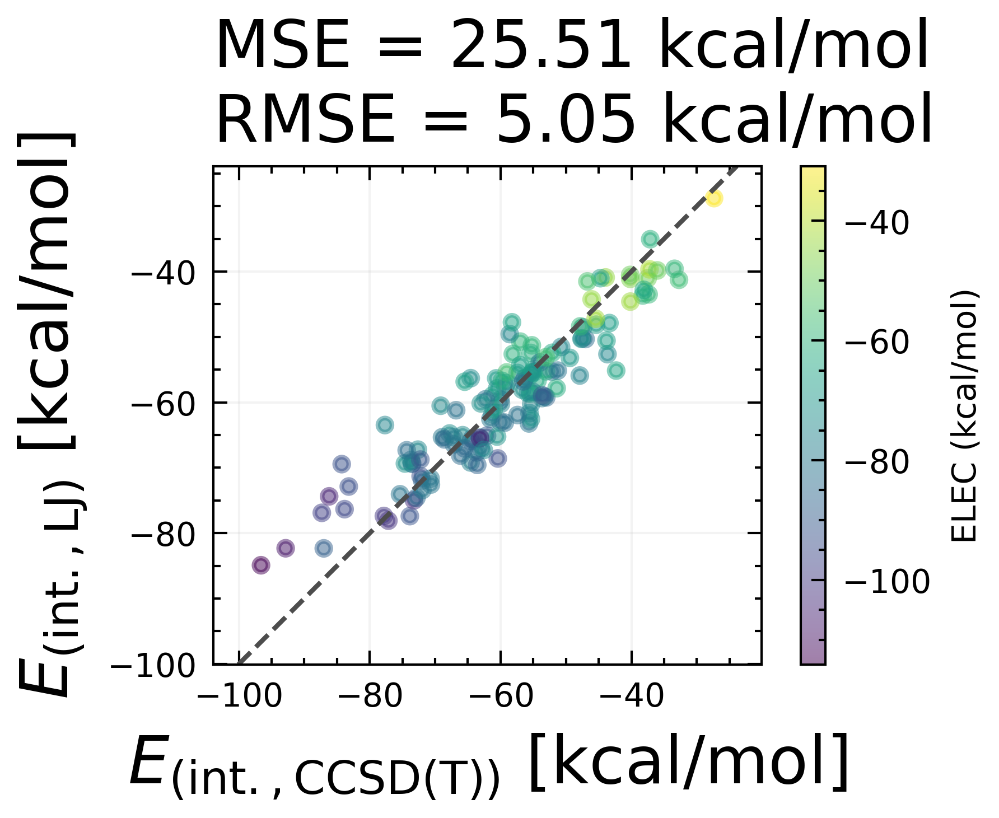

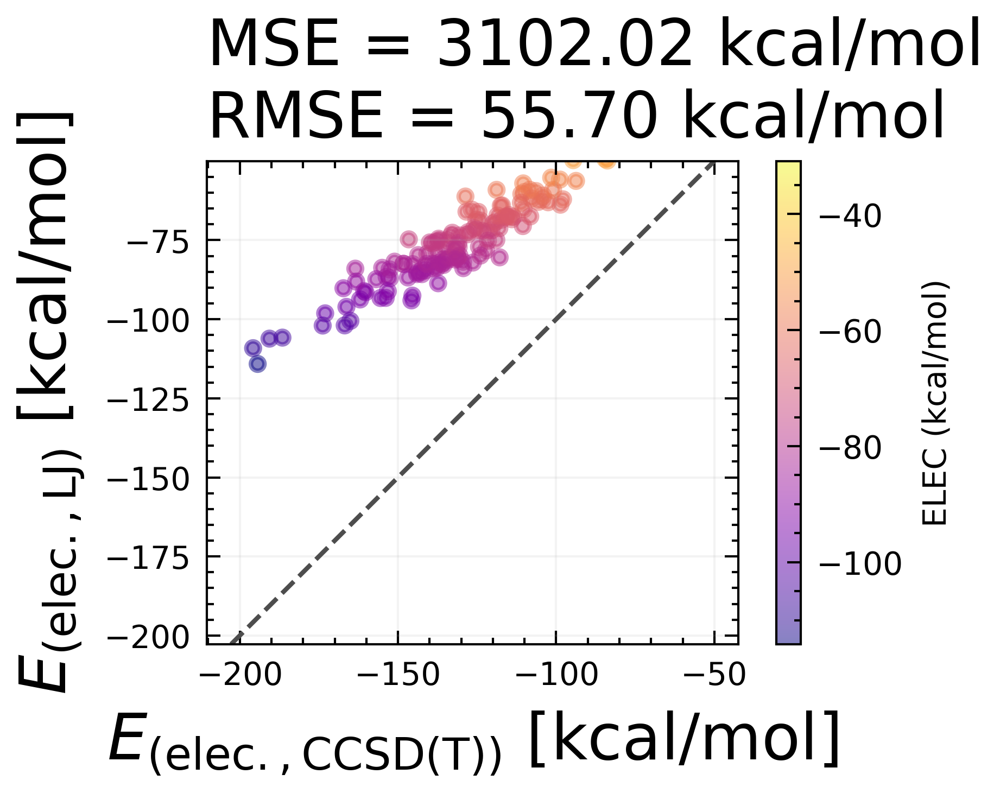

In [433]:
ff = prepare_FF_DE(cluster_pc)

method = "Nelder-Mead"
ff.fit_repeat(3, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")



Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters


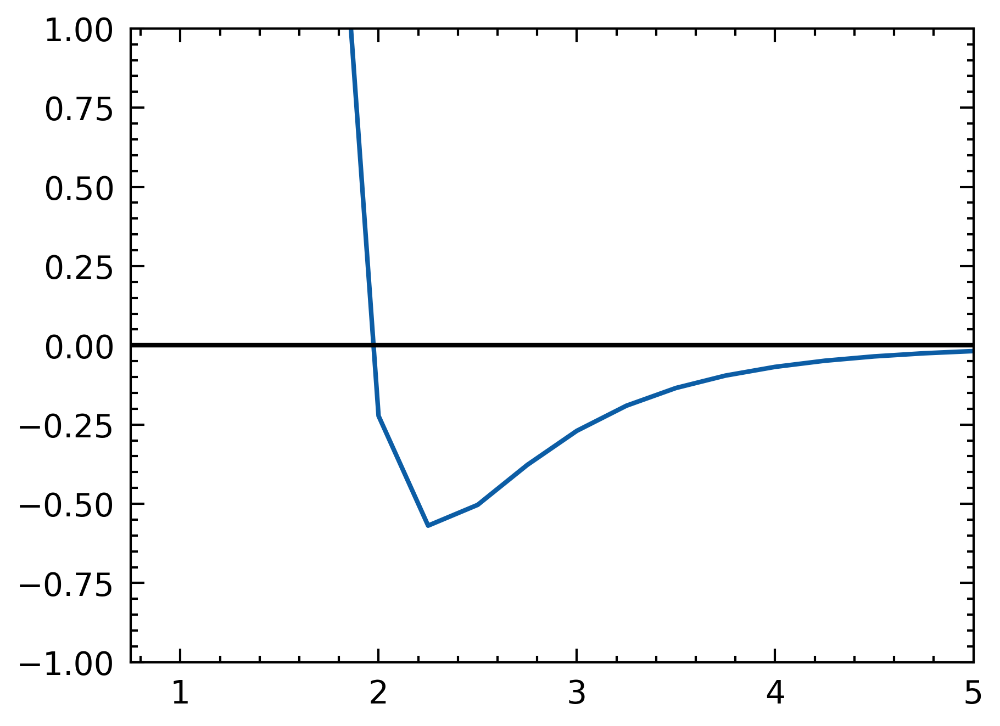

In [434]:
plot_2d(ff)

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
0.04502451453523887 184.75456947448384 184.7095449599486
1
1
-4.22723014018664 30.304627058946664 34.531857199133306
1
1


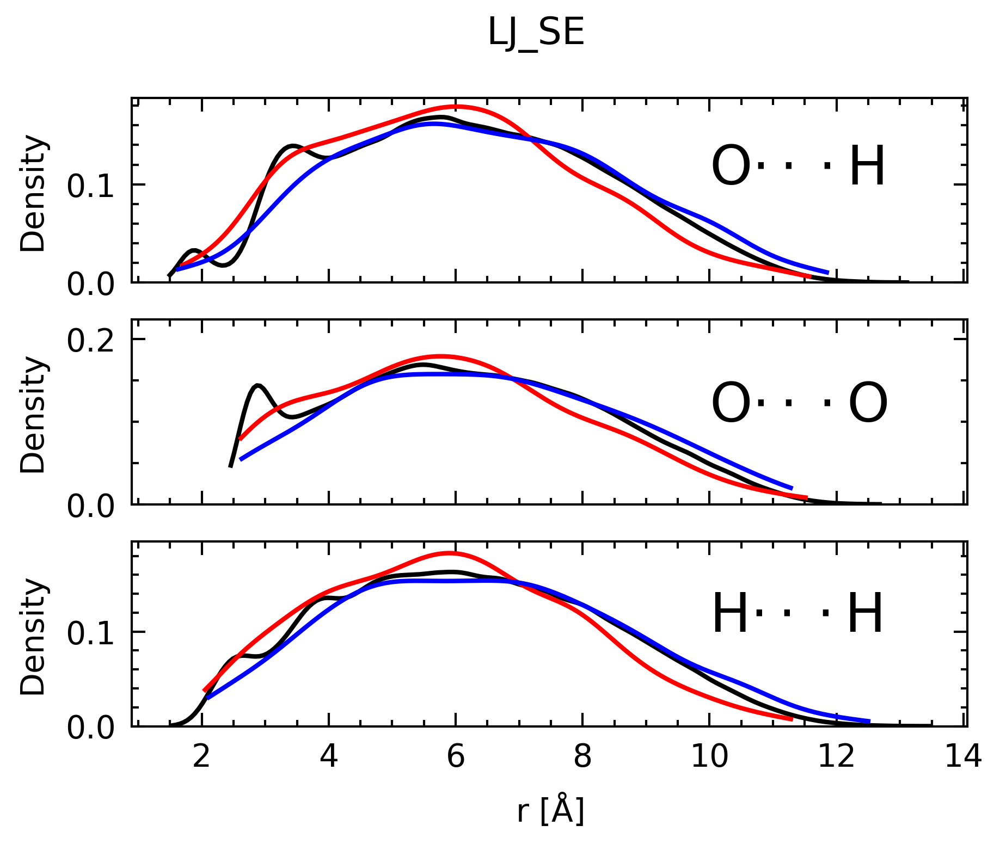

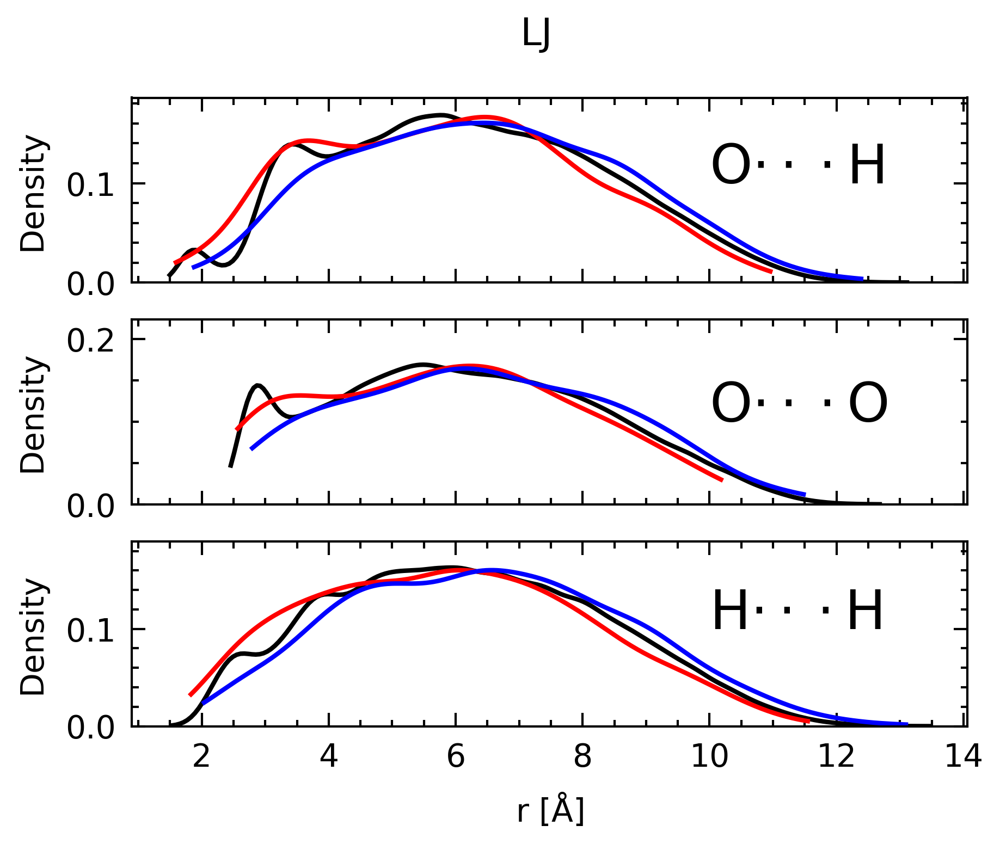

In [365]:
best = ff.get_best_df()
plot_dists(ff, key="LJ_SE", df=best, q1=0.005, q3=0.995)
plot_dists(ff, key="LJ", df=best, q1=0.005, q3=0.995)

# free DE

##  MDCM - free DE

In [ ]:
ff = prepare_FF_freeDE(cluster_mdcm)

method = "Nelder-Mead"
ff.fit_repeat(20, bounds=bounds_6, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

##  f-MDCM - free DE

In [ ]:
ff = prepare_FF_freeDE(cluster_flux)

method = "Nelder-Mead"
ff.fit_repeat(20, bounds=bounds_6, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

##  Kern-MDCM - free DE

In [ ]:
ff = prepare_FF_freeDE(cluster_kern)

method = "Nelder-Mead"
ff.fit_repeat(20, bounds=bounds_6, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

##  ELST - free DE

In [ ]:
ff = prepare_FF_freeDE(cluster_mdcm, elec="ELST")

method = "Nelder-Mead"
ff.fit_repeat(20, bounds=bounds_6, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", "ELST", 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

##  PC - free DE

In [ ]:
ff = prepare_FF_freeDE(cluster_pc)

method = "Nelder-Mead"
ff.fit_repeat(20, bounds=bounds_6, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

# LJ

##  MDCM - LJ

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.79406988e+00 1.00000000e-04 2.06169684e-01 1.06437939e-01]


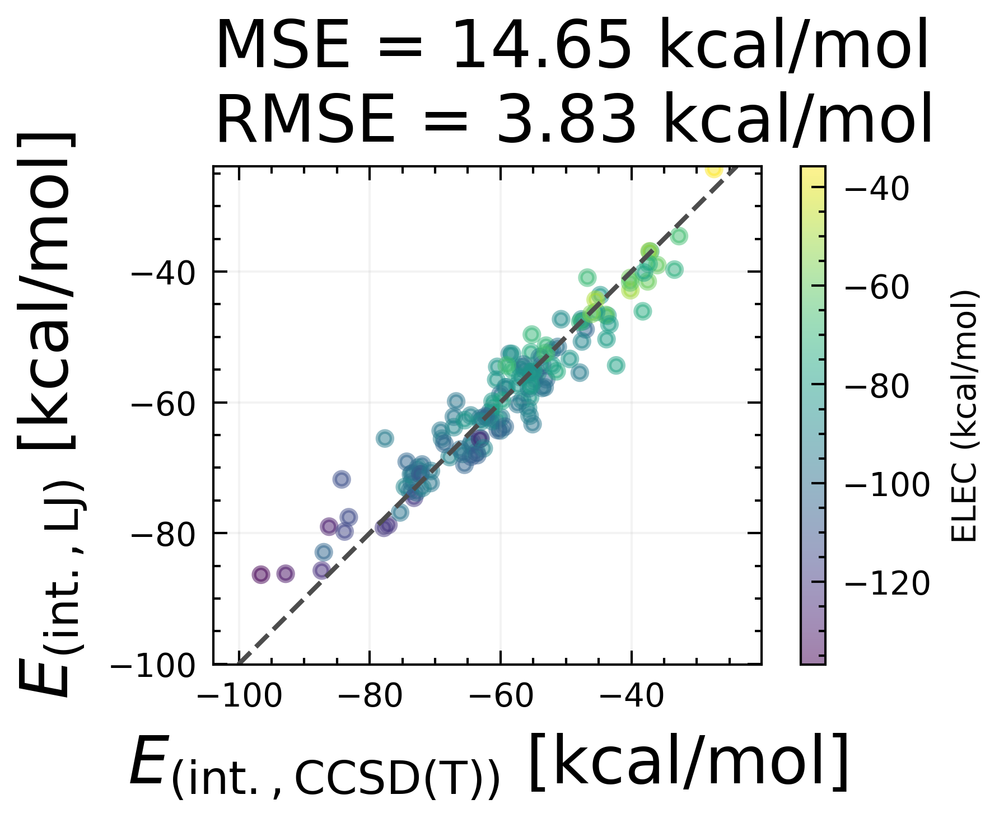

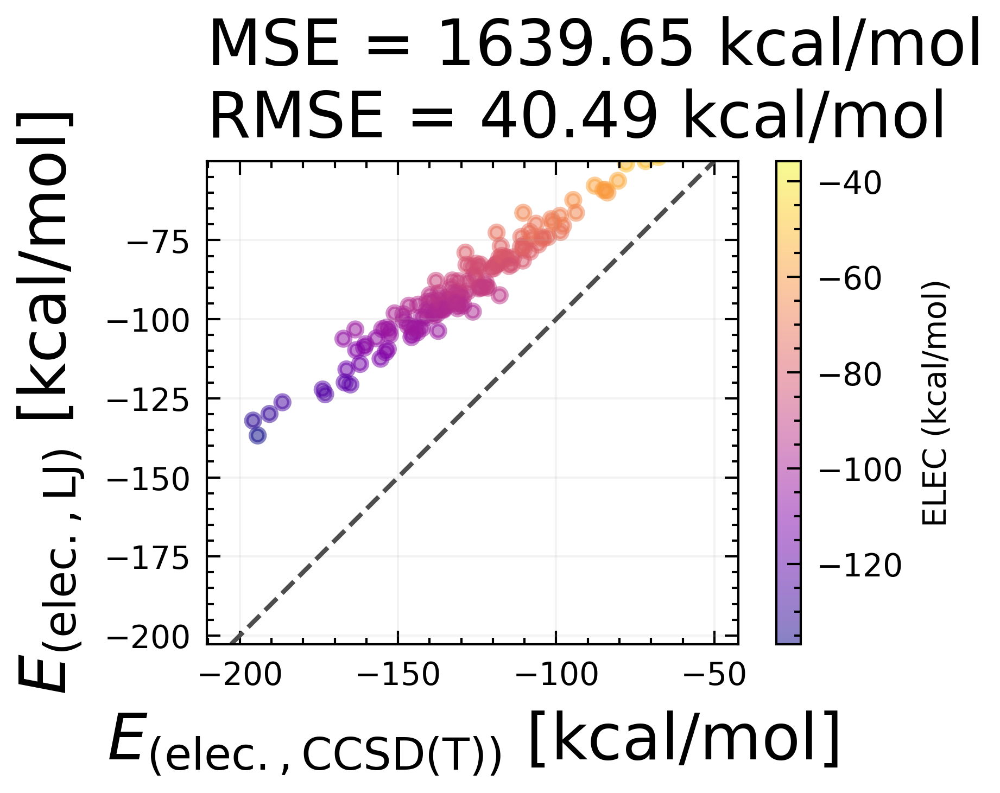

In [378]:
ff = prepare_FF_LJ(cluster_mdcm)

method = "Nelder-Mead"
ff.fit_repeat(10, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

###  dists SE

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
8.769022550448029e-05 150.47633428730452 150.476246597079
1
1
6.214041267728947 56.53272593832605 50.31868467059711
1
1


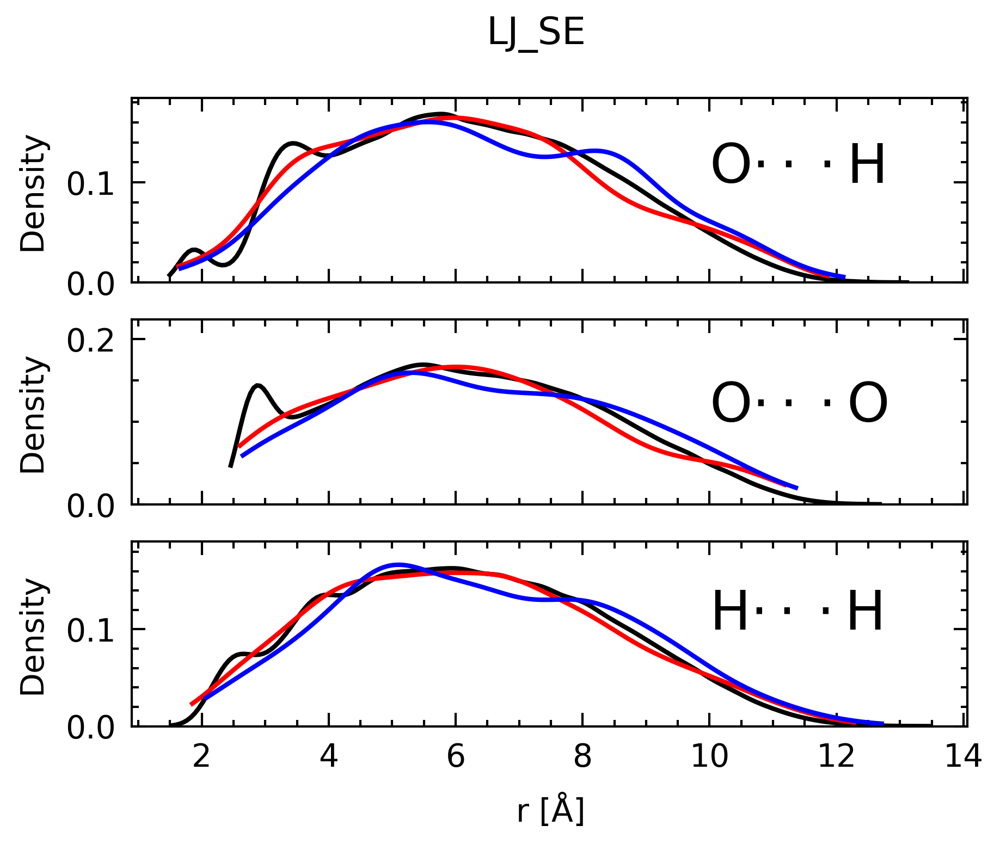

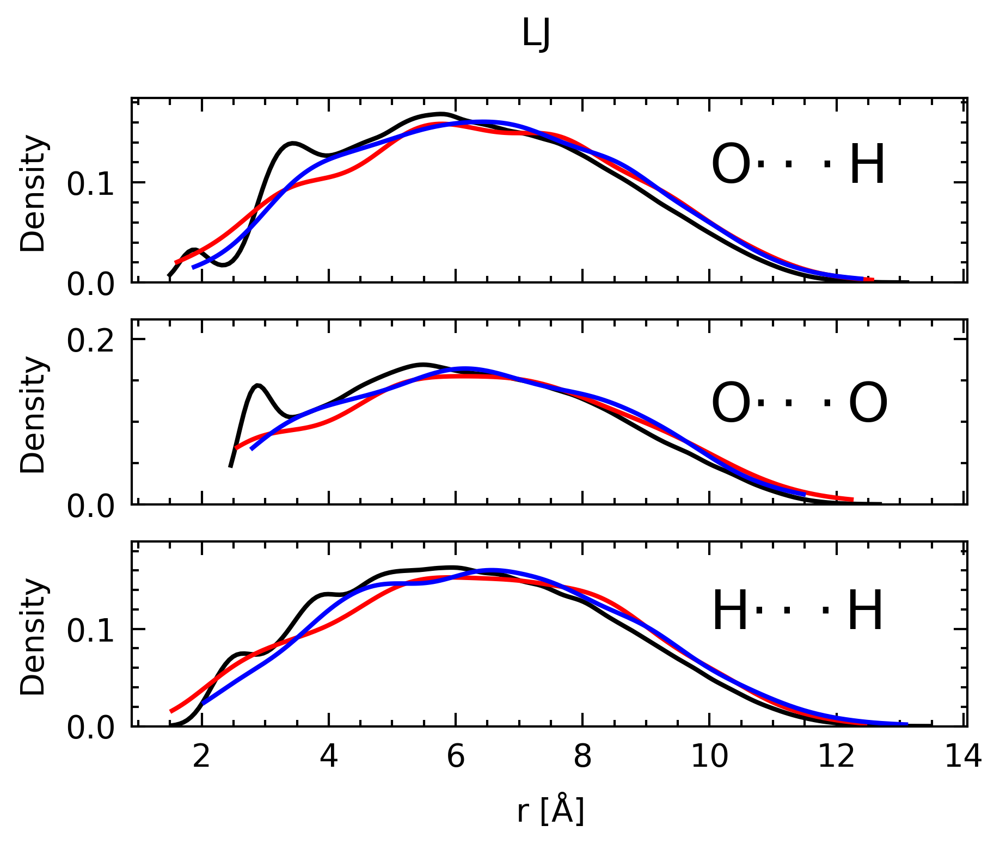

In [379]:
best = ff.get_best_df()
plot_dists(ff, key="LJ_SE", df=best, q1=0.005, q3=0.995)
plot_dists(ff, key="LJ", df=best, q1=0.005, q3=0.995)

##  f-MDCM - LJ

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.77597831e+00 1.00000000e-04 2.15573092e-01 1.25905389e-02]


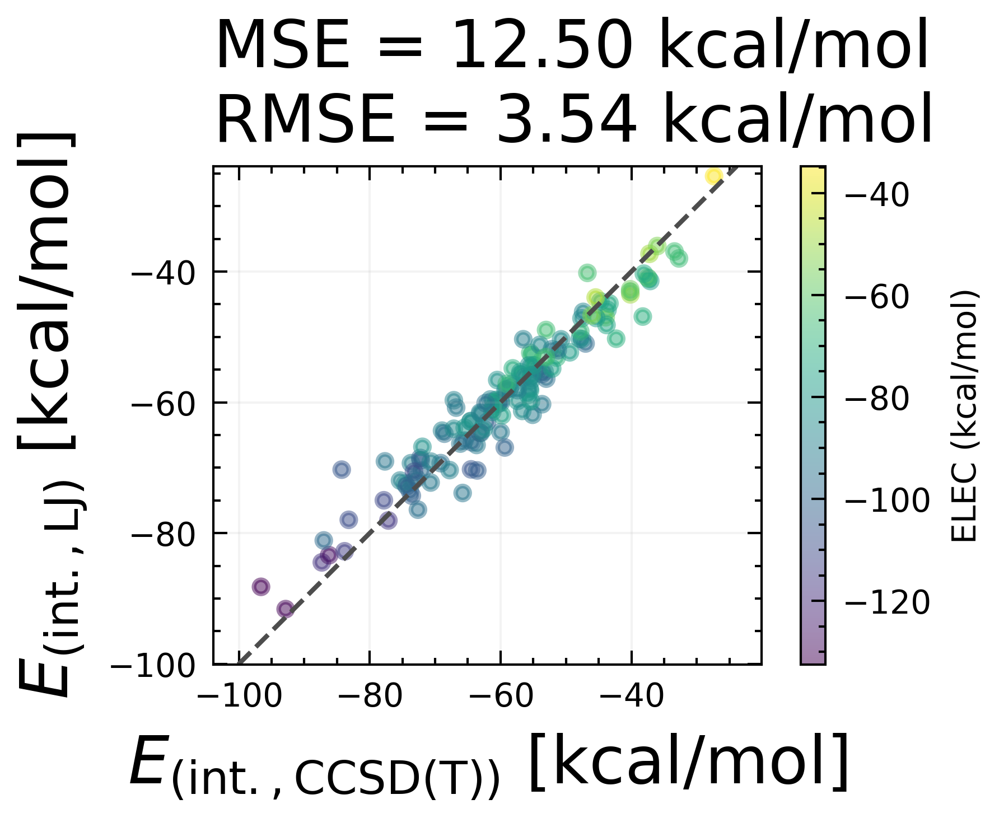

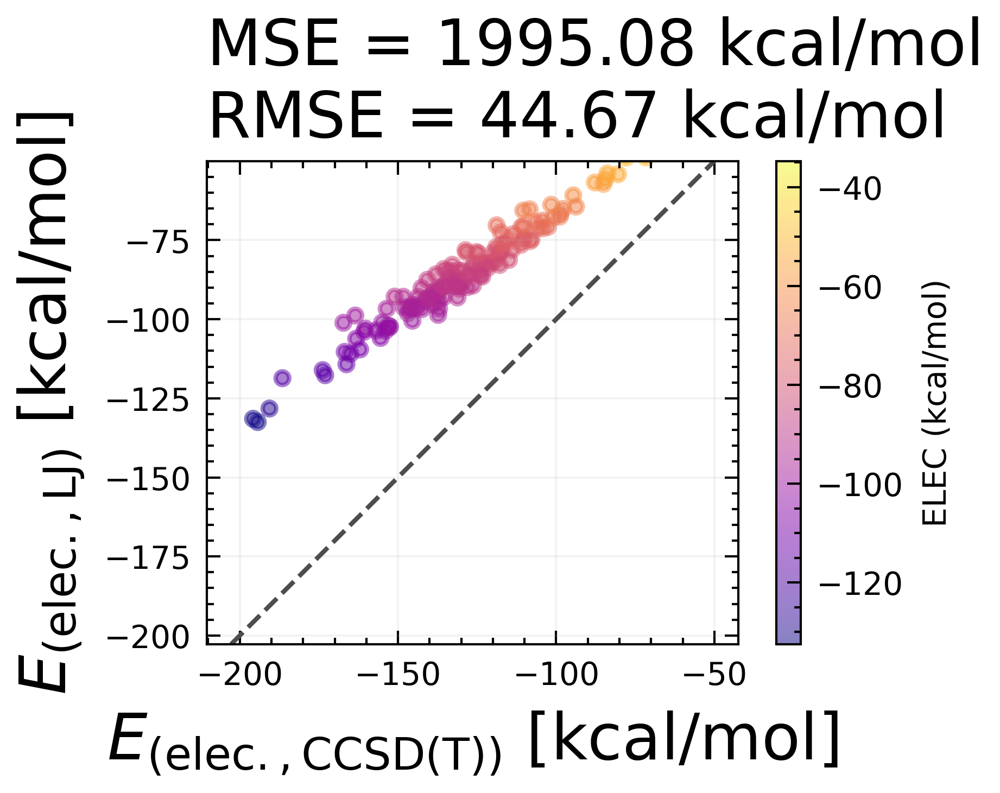

In [382]:
ff = prepare_FF_LJ(cluster_flux)

method = "Nelder-Mead"
ff.fit_repeat(10, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

In [ ]:
best = ff.get_best_df()
plot_dists(ff, key="LJ_SE", df=best, q1=0.005, q3=0.995)
plot_dists(ff, key="LJ", df=best, q1=0.005, q3=0.995)

##  Kern-MDCM - LJ

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.7801829  0.18052696 0.20742109 0.05492052]


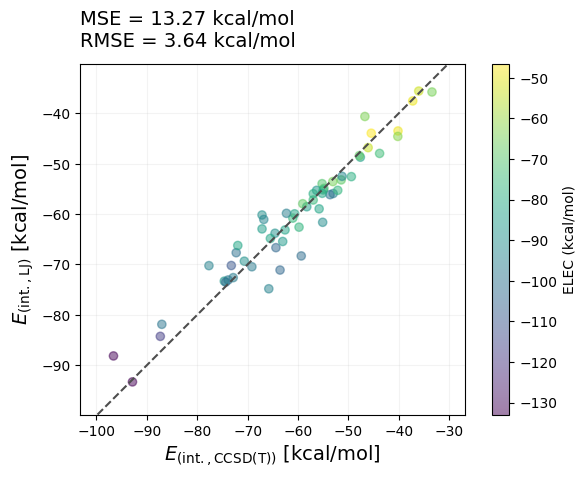

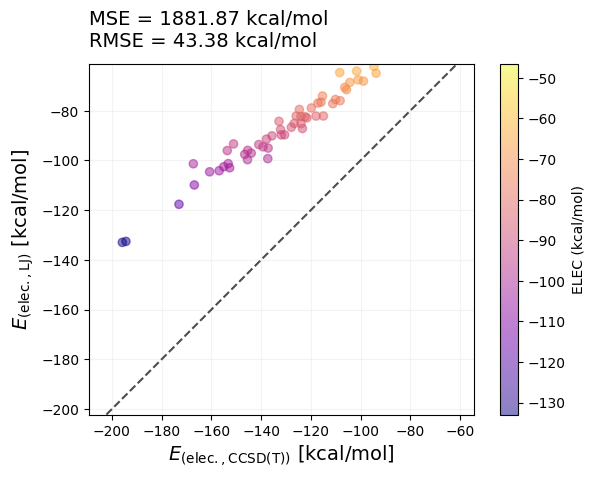

In [139]:
ff = prepare_FF_LJ(cluster_kern)

method = "Nelder-Mead"
ff.fit_repeat(10, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

##  ELST - LJ

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.97164499e+00 1.00000000e-04 9.56157364e-02 3.40201989e-01]


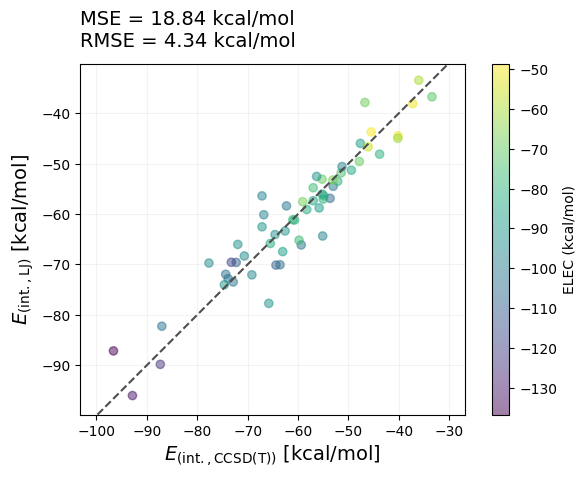

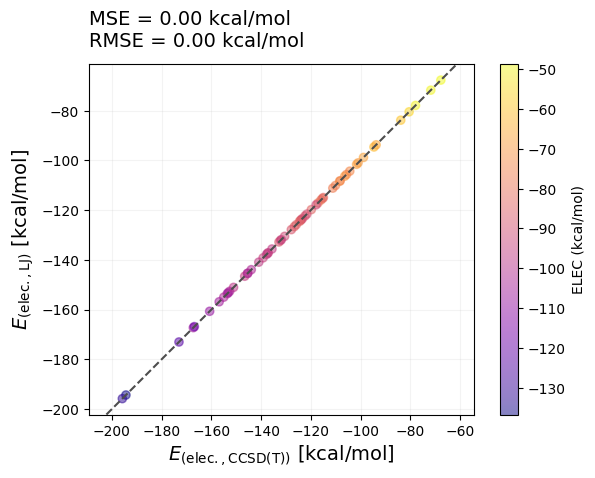

In [140]:
ff = prepare_FF_LJ(cluster_mdcm, elec="ELST")

method = "Nelder-Mead"
ff.fit_repeat(10, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", "ELST", 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

##  PC - LJ

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.71622418e+00 1.00000000e-04 3.29578177e-01 4.17586731e-01]


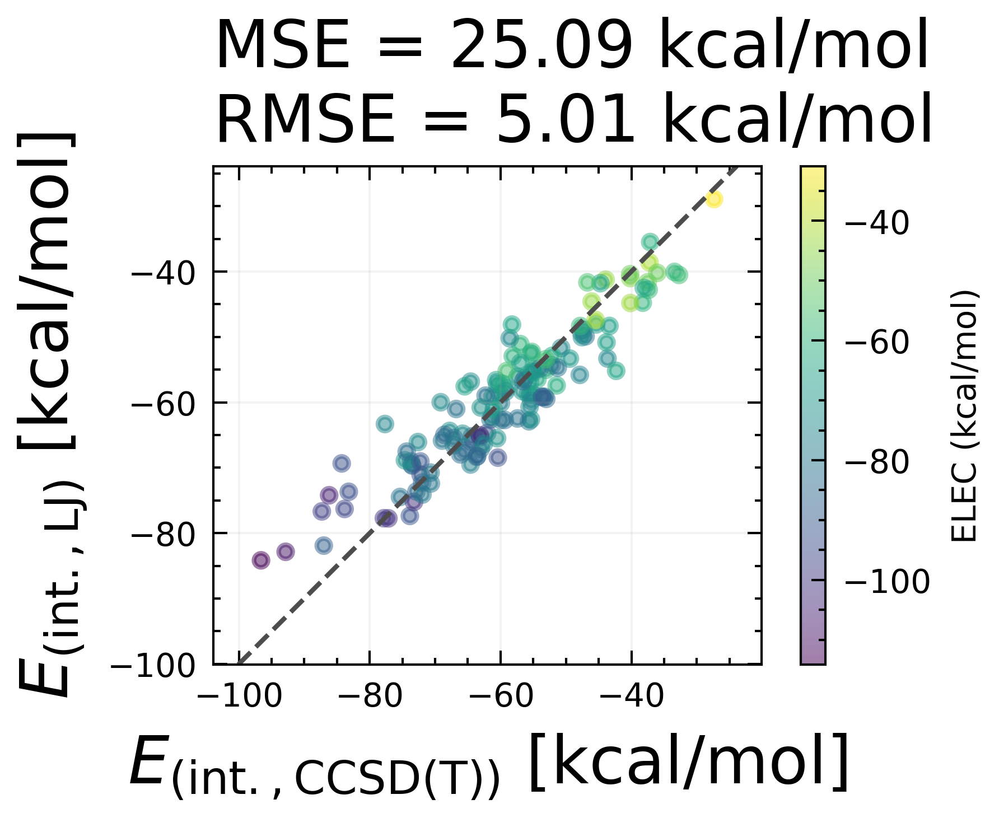

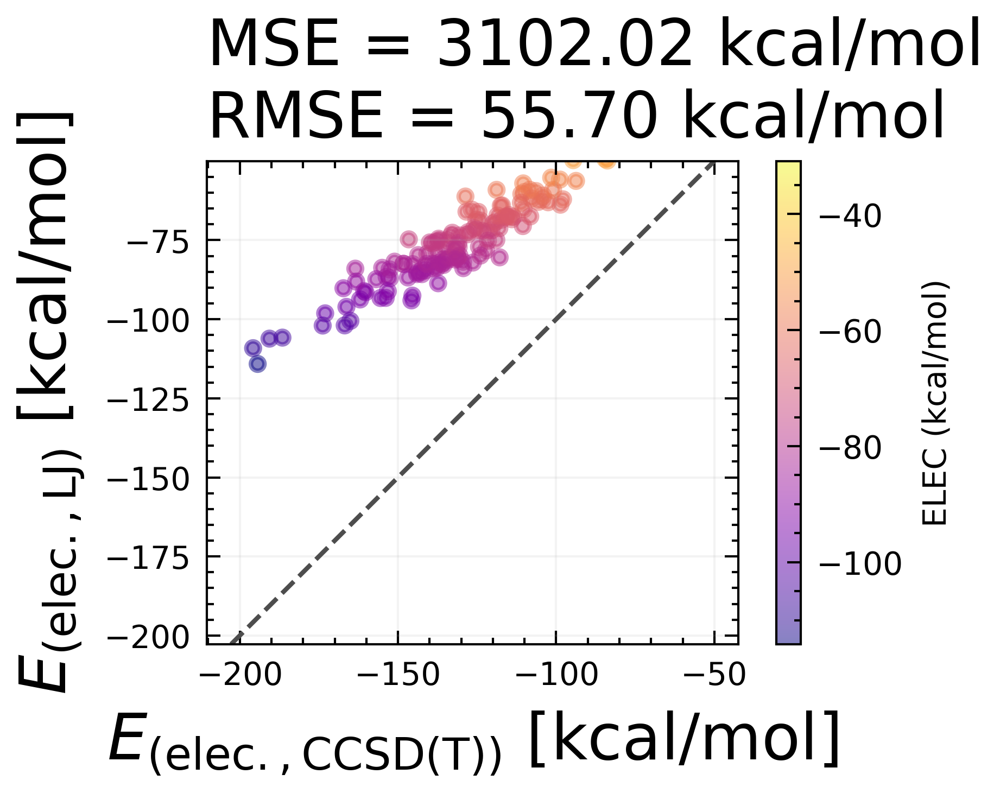

In [380]:
ff = prepare_FF_LJ(cluster_pc)

method = "Nelder-Mead"
ff.fit_repeat(10, bounds=bounds_4, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

###  dists SE

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
0.001660488016489484 211.9487756728657 211.94711518484922
1
1
-2.7201290467948214 36.36508343771879 39.08521248451361
1
1


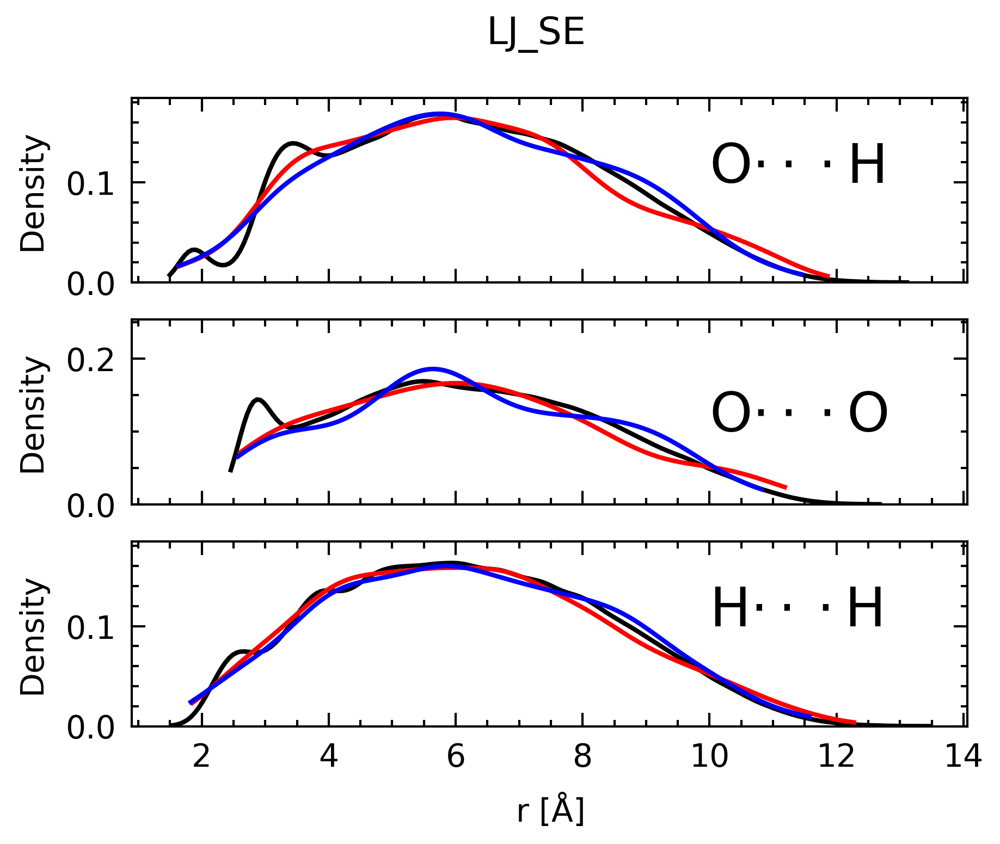

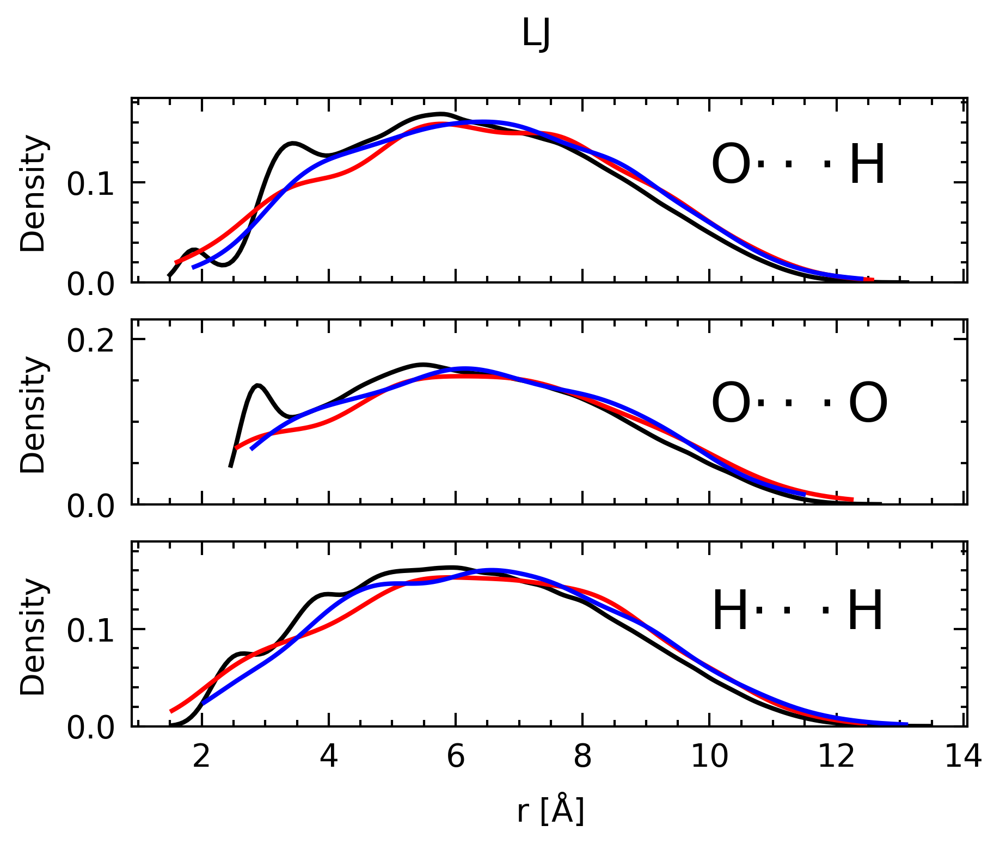

In [381]:
best = ff.get_best_df()
plot_dists(ff, key="LJ_SE", df=best, q1=0.005, q3=0.995)
plot_dists(ff, key="LJ", df=best, q1=0.005, q3=0.995)

#  free LJ

##  MDCM - freeLJ

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[3.89836871 0.42434445 2.         1.98999805 9.60689451 1.0000486
 1.00042284]


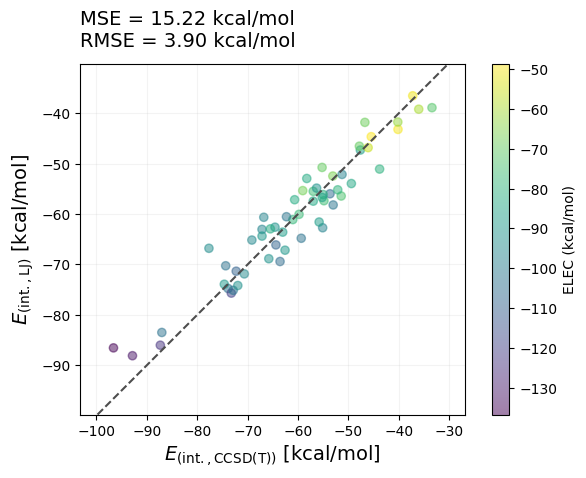

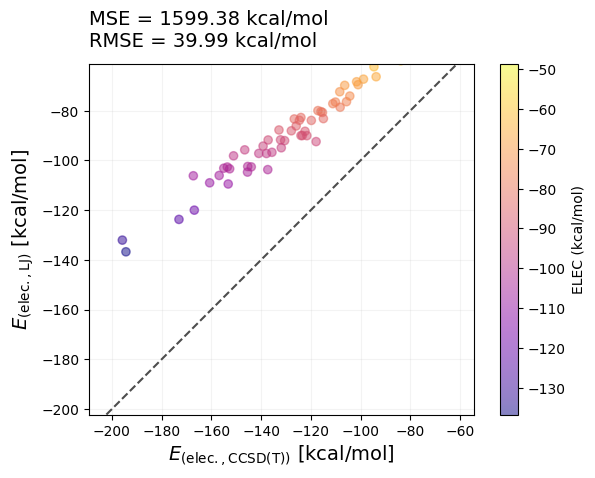

In [167]:
ff = prepare_FF_freeLJ(cluster_mdcm)

method = "Nelder-Mead"
ff.fit_repeat(30, bounds=bounds_7, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

##  f-MDCM - freeLJ

/home/boittier/miniconda3/envs/pycharmm/lib/python3.8/site-packages/scipy/optimize/_optimize.py:863: RuntimeWarning: invalid value encountered in subtract
  np.max(np.abs(fsim[0] - fsim[1:])) <= fatol):
/home/boittier/miniconda3/envs/pycharmm/lib/python3.8/site-packages/scipy/optimize/_optimize.py:863: RuntimeWarning: invalid value encountered in subtract
  np.max(np.abs(fsim[0] - fsim[1:])) <= fatol):
/home/boittier/miniconda3/envs/pycharmm/lib/python3.8/site-packages/scipy/optimize/_optimize.py:863: RuntimeWarning: invalid value encountered in subtract
  np.max(np.abs(fsim[0] - fsim[1:])) <= fatol):
/home/boittier/miniconda3/envs/pycharmm/lib/python3.8/site-packages/scipy/optimize/_optimize.py:863: RuntimeWarning: invalid value encountered in subtract
  np.max(np.abs(fsim[0] - fsim[1:])) <= fatol):
/home/boittier/miniconda3/envs/pycharmm/lib/python3.8/site-packages/scipy/optimize/_optimize.py:863: RuntimeWarning: invalid value encountered in subtract
  np.max(np.abs(fsim[0] - fsim[1:

Set optimized parameters to FF object, use FF.opt_parm to get the optimized parameters
Set optimized parameters to FF object, self.df["LJ"] is updated.
[1.57933531 0.12607709 1.2398766  1.10752289 6.83305842 1.64245489
 1.        ]


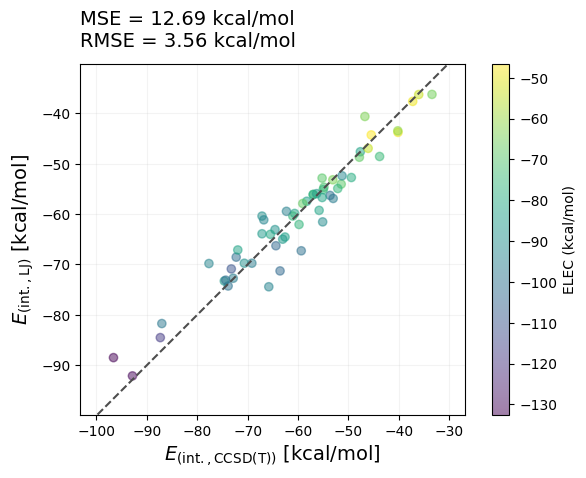

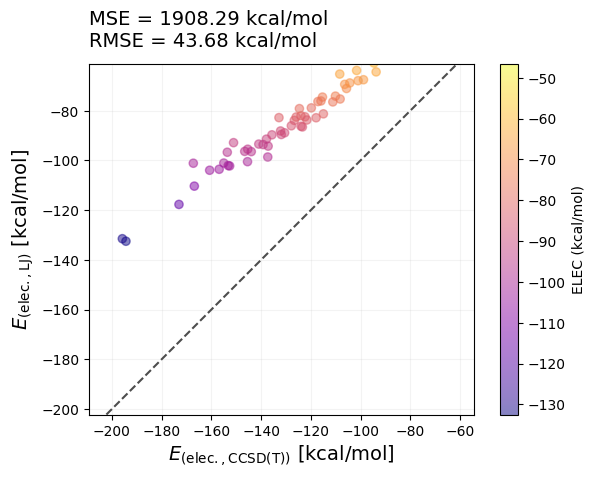

In [168]:
ff = prepare_FF_freeLJ(cluster_flux)

method = "Nelder-Mead"
ff.fit_repeat(30, bounds=bounds_7, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

##  Kern-MDCM - freeLJ

In [144]:
ff = prepare_FF_freeLJ(cluster_kern)

method = "Nelder-Mead"
ff.fit_repeat(30, bounds=bounds_7, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

KeyboardInterrupt: 

##  ELST - freeLJ

In [ ]:
ff = prepare_FF_freeLJ(cluster_mdcm, elec="ELST")

method = "Nelder-Mead"
ff.fit_repeat(30, bounds=bounds_7, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", "ELST", 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")

##  PC - freeLJ

In [ ]:
ff = prepare_FF_freeLJ(cluster_pc)

method = "Nelder-Mead"
ff.fit_repeat(30, bounds=bounds_7, method=method, quiet=True)

print(ff.opt_parm)

plot_energy_MSE(ff.df, "ETOT", "ETOT_LJ", 
                xlabel="$E_{\mathrm{(int., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(int., LJ)}}$ [kcal/mol]")

plot_energy_MSE(ff.df, "ELST", elec, 
                CMAP="plasma",
                xlabel="$E_{\mathrm{(elec., CCSD(T))}}$ [kcal/mol]", 
                ylabel="$E_{\mathrm{(elec., LJ)}}$ [kcal/mol]")